# House Price Prediction using Regularisation

## Business Description

1. A US-based housing company named Surprise Housing has decided to enter the Australian market. 
2. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price.


## Business Goal

1. The company is looking at prospective properties to buy to enter the market. 
2. Requirement is to build a regression model using regularisation in order to predict the actual value of the prospective properties and decide whether to invest in them or not.
3. The company wants to know:
    a. Which variables are significant in predicting the price of a house, and
    b. How well those variables describe the price of a house.

## Objective of the Project

1. You are required to model the price of houses with the available independent variables using Regularisation.
2. This model will then be used by the management to understand how exactly the prices vary with the variables. 
3. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. 
4. Further, the model will be a good way for management to understand the pricing dynamics of a new market.
5. Determine the optimal value of lambda for ridge and lasso regression.
    
## Process to solve this business problem
1. Step 1 : Data Understanding and Exploratory Data Analysis (EDA)
2. Step 2 : Data Preperation
3. Step 3 : Training the model
4. Step 4 : Model Prediction and Evaluation using Redge and Lasso Regularization
5. Step 5 : Conclusions and Results


In [1]:
# Suppress Warning
import warnings
warnings.filterwarnings('ignore')

# Import Required Libs
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import sklearn
from sklearn.model_selection import train_test_split #for spliting the data in terms of train and test
from sklearn.preprocessing import MinMaxScaler, LabelEncoder #for performing minmax scaling on the continous variables of training data
from sklearn.feature_selection import RFE #for performing automated Feature Selection
from sklearn.linear_model import LinearRegression #to build linear model
from sklearn.linear_model import Ridge #for ridge regularization
from sklearn.linear_model import Lasso #for lasso regularization
from sklearn.model_selection import GridSearchCV #finding the optimal parameter values
from sklearn.metrics import r2_score #for calculating the r-square value
import statsmodels.api as sm #for add the constant value
from sklearn import metrics
from statsmodels.stats.outliers_influence import variance_inflation_factor #to calculate the VIF
from sklearn.metrics import mean_squared_error #for calculating the mean squared error


pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
warnings.filterwarnings('ignore')

## 1. Step 1 : Data Understanding and Exploratory Data Analysis (EDA)

### 1.1: Reading and Understanding the data

In [2]:
# Load the Data and check the values and understand the data
housing_data = pd.read_csv("train.csv")
housing_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [3]:
housing_data.shape

(1460, 81)

In [4]:
housing_data.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [5]:
housing_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [6]:
housing_data.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

### 1.2: Data Cleaning, Validation and Manipulation

In [7]:
# Check for any duplicated rows
# By default, for each set of duplicated values, the first occurrence is set on False and all others are True.
print("The total number of Duplicate Rows are/is" , housing_data.duplicated().sum())

The total number of Duplicate Rows are/is 0


In [8]:
# check for sum of null values for each column
housing_data.isnull().sum().sort_values(ascending=False)

PoolQC           1453
MiscFeature      1406
Alley            1369
Fence            1179
MasVnrType        872
FireplaceQu       690
LotFrontage       259
GarageYrBlt        81
GarageCond         81
GarageType         81
GarageFinish       81
GarageQual         81
BsmtFinType2       38
BsmtExposure       38
BsmtQual           37
BsmtCond           37
BsmtFinType1       37
MasVnrArea          8
Electrical          1
Id                  0
Functional          0
Fireplaces          0
KitchenQual         0
KitchenAbvGr        0
BedroomAbvGr        0
HalfBath            0
FullBath            0
BsmtHalfBath        0
TotRmsAbvGrd        0
GarageCars          0
GrLivArea           0
GarageArea          0
PavedDrive          0
WoodDeckSF          0
OpenPorchSF         0
EnclosedPorch       0
3SsnPorch           0
ScreenPorch         0
PoolArea            0
MiscVal             0
MoSold              0
YrSold              0
SaleType            0
SaleCondition       0
BsmtFullBath        0
HeatingQC 

In [9]:
# check the columns valid null count > 0
housing_data.isnull().sum().sort_values(ascending=False).to_frame(name='counts').query('counts > 0')

,counts
PoolQC,1453
MiscFeature,1406
Alley,1369
Fence,1179
MasVnrType,872
FireplaceQu,690
LotFrontage,259
GarageYrBlt,81
GarageCond,81
GarageType,81


In [10]:
# Check the Percentage of null values
columnNullPercentage = pd.DataFrame(round((housing_data.isnull().sum()/len(housing_data))*100,2).sort_values(ascending=False),columns=["Null%"])
columnNullPercentage_df = columnNullPercentage[columnNullPercentage["Null%"] > 0]
columnNullPercentage_df

,Null%
PoolQC,99.52
MiscFeature,96.30
Alley,93.77
Fence,80.75
MasVnrType,59.73
FireplaceQu,47.26
LotFrontage,17.74
GarageYrBlt,5.55
GarageCond,5.55
GarageType,5.55


#### PoolQC , MiscFeature and Alley have missing values more than 90%
#### Fence and FireplaceQu have missing values more than 50%
#### Removing the columns havinge more than 70% missing values as they are not beneficial, because even if we impute them, most of the values remain same and which will not help in our analysis.

In [11]:
# making list of columns that have high missing values that we want to remove 
# Threashold taken for missing values 70%
columnToRemove =[]
for i in housing_data.columns:
    if(housing_data[i].isnull().mean()*100>=70.00):
        columnToRemove.append(i)
        
print("The Below Columns are removed from the Dataset :\n")
print(columnToRemove)

The Below Columns are removed from the Dataset :

['Alley', 'PoolQC', 'Fence', 'MiscFeature']


In [12]:
# Removing these columns and verifying the shape of the dataset
housing_data.drop(columnToRemove,axis=1,inplace=True)
housing_data.shape

(1460, 77)

In [13]:
# Lets drop the ID column as it cannot be used for analysis
housing_data=housing_data.drop('Id',axis='columns')
housing_data.shape

(1460, 76)

In [14]:
columnNullPercentage = pd.DataFrame(round((housing_data.isnull().sum()/len(housing_data))*100,2).sort_values(ascending=False),columns=["Null%"])
columnNullPercentage_df = columnNullPercentage[columnNullPercentage["Null%"] > 0]
columnNullPercentage_df

,Null%
MasVnrType,59.73
FireplaceQu,47.26
LotFrontage,17.74
GarageType,5.55
GarageYrBlt,5.55
GarageFinish,5.55
GarageQual,5.55
GarageCond,5.55
BsmtExposure,2.60
BsmtFinType2,2.60


In [15]:
#As mentioned in the Data Dictionary NA value means it is not present and thus we can replace it with none
null_with_meaning = ["MasVnrType", "FireplaceQu", "BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1", "BsmtFinType2", "GarageType", "GarageFinish", "GarageQual", "GarageCond"]
for i in null_with_meaning:
    housing_data[i].fillna("none", inplace=True)
    
housing_data.shape

(1460, 76)

In [16]:
# check the columns valid null count > 0
housing_data.isnull().sum().sort_values(ascending=False).to_frame(name='counts').query('counts > 0')

,counts
LotFrontage,259
GarageYrBlt,81
MasVnrArea,8
Electrical,1


In [17]:
# We will replace the null with median for LotFrontage MasVnrArea and GarageYrBlt columns 
housing_data["LotFrontage"].fillna(housing_data["LotFrontage"].median(), inplace=True)
housing_data["MasVnrArea"].fillna(housing_data["MasVnrArea"].median(), inplace=True)
housing_data["GarageYrBlt"].fillna(housing_data["GarageYrBlt"].median(), inplace=True)

In [18]:
# Filling the Electrical with the mode
housing_data['Electrical'] = housing_data['Electrical'].fillna(housing_data['Electrical'].mode()[0])

In [19]:
#Validating the null values again
100*housing_data.isnull().mean().sort_values(ascending=False)

MSSubClass       0.0
HalfBath         0.0
FireplaceQu      0.0
Fireplaces       0.0
Functional       0.0
TotRmsAbvGrd     0.0
KitchenQual      0.0
KitchenAbvGr     0.0
BedroomAbvGr     0.0
FullBath         0.0
MSZoning         0.0
BsmtHalfBath     0.0
BsmtFullBath     0.0
GrLivArea        0.0
LowQualFinSF     0.0
2ndFlrSF         0.0
1stFlrSF         0.0
Electrical       0.0
GarageType       0.0
GarageYrBlt      0.0
GarageFinish     0.0
GarageCars       0.0
SaleCondition    0.0
SaleType         0.0
YrSold           0.0
MoSold           0.0
MiscVal          0.0
PoolArea         0.0
ScreenPorch      0.0
3SsnPorch        0.0
EnclosedPorch    0.0
OpenPorchSF      0.0
WoodDeckSF       0.0
PavedDrive       0.0
GarageCond       0.0
GarageQual       0.0
GarageArea       0.0
CentralAir       0.0
HeatingQC        0.0
Heating          0.0
YearRemodAdd     0.0
OverallCond      0.0
OverallQual      0.0
HouseStyle       0.0
BldgType         0.0
Condition2       0.0
Condition1       0.0
Neighborhood 

#### Observations : There are No Missing values in the Dataset now.

In [20]:
# Creating Derived Variables
# Overall area for all floors and basement plays an important role, hence creating total area in square foot column
housing_data['Total_sqr_footage'] = (housing_data['BsmtFinSF1'] + housing_data['BsmtFinSF2'] + housing_data['1stFlrSF'] + housing_data['2ndFlrSF'])
# Creating derived column for total number of bathrooms column
housing_data['Total_Bathrooms'] = (housing_data['FullBath'] + (0.5 * housing_data['HalfBath']) + housing_data['BsmtFullBath'] + (0.5 * housing_data['BsmtHalfBath']))
#Creating derived column for total porch area 
housing_data['Total_porch_sf'] = (housing_data['OpenPorchSF'] + housing_data['3SsnPorch'] + housing_data['EnclosedPorch'] + housing_data['ScreenPorch'] + housing_data['WoodDeckSF'])


In [21]:
housing_data.shape

(1460, 79)

In [22]:
#Lets drop these extra columns from which we have created derived variables:
extraCols = ['BsmtFinSF1','BsmtFinSF2','1stFlrSF','2ndFlrSF','FullBath','HalfBath','BsmtFullBath','BsmtHalfBath','OpenPorchSF','3SsnPorch','EnclosedPorch','ScreenPorch','WoodDeckSF']
housing_data.drop(extraCols,axis=1,inplace=True)
housing_data.shape# verifying the shape of the dataset

(1460, 66)

In [23]:
#Checking the unique data of each Column
for i in housing_data.columns :
    print(i,"\n")
    print(housing_data[i].value_counts(),"\n")
    print("****************************************")

MSSubClass 

MSSubClass
20     536
60     299
50     144
120     87
30      69
160     63
70      60
80      58
90      52
190     30
85      20
75      16
45      12
180     10
40       4
Name: count, dtype: int64 

****************************************
MSZoning 

MSZoning
RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: count, dtype: int64 

****************************************
LotFrontage 

LotFrontage
69.0     270
60.0     143
70.0      70
80.0      69
50.0      57
75.0      53
65.0      44
85.0      40
78.0      25
21.0      23
90.0      23
24.0      19
68.0      19
64.0      19
73.0      18
55.0      17
63.0      17
72.0      17
79.0      17
100.0     16
74.0      15
66.0      15
51.0      15
52.0      14
59.0      13
82.0      12
71.0      12
43.0      12
67.0      12
40.0      12
57.0      12
76.0      11
34.0      10
53.0      10
86.0      10
92.0      10
88.0      10
44.0       9
84.0       9
35.0       9
62.0       9
77.0       9
9

KitchenAbvGr
1    1392
2      65
3       2
0       1
Name: count, dtype: int64 

****************************************
KitchenQual 

KitchenQual
TA    735
Gd    586
Ex    100
Fa     39
Name: count, dtype: int64 

****************************************
TotRmsAbvGrd 

TotRmsAbvGrd
6     402
7     329
5     275
8     187
4      97
9      75
10     47
11     18
3      17
12     11
2       1
14      1
Name: count, dtype: int64 

****************************************
Functional 

Functional
Typ     1360
Min2      34
Min1      31
Mod       15
Maj1      14
Maj2       5
Sev        1
Name: count, dtype: int64 

****************************************
Fireplaces 

Fireplaces
0    690
1    650
2    115
3      5
Name: count, dtype: int64 

****************************************
FireplaceQu 

FireplaceQu
none    690
Gd      380
TA      313
Fa       33
Ex       24
Po       20
Name: count, dtype: int64 

****************************************
GarageType 

GarageType
Attchd     870
Detchd 

In [24]:
# checking aggregrate details of value count of each colum
housing_data.agg(['count','nunique','unique'])

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,LowQualFinSF,GrLivArea,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Total_sqr_footage,Total_Bathrooms,Total_porch_sf
count,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460
nunique,15,5,110,1073,2,4,4,2,5,3,25,9,8,5,8,10,9,112,61,6,8,15,16,4,327,4,5,6,5,5,5,7,7,780,721,6,5,2,5,24,861,8,4,4,12,7,4,6,7,97,4,5,441,6,6,3,8,21,12,5,9,6,663,1052,10,427
unique,"[60, 20, 70, 50, 190, 45, 90, 120, 30, 85, 80,...","[RL, RM, C (all), FV, RH]","[65.0, 80.0, 68.0, 60.0, 84.0, 85.0, 75.0, 69....","[8450, 9600, 11250, 9550, 14260, 14115, 10084,...","[Pave, Grvl]","[Reg, IR1, IR2, IR3]","[Lvl, Bnk, Low, HLS]","[AllPub, NoSeWa]","[Inside, FR2, Corner, CulDSac, FR3]","[Gtl, Mod, Sev]","[CollgCr, Veenker, Crawfor, NoRidge, Mitchel, ...","[Norm, Feedr, PosN, Artery, RRAe, RRNn, RRAn, ...","[Norm, Artery, RRNn, Feedr, PosN, PosA, RRAn, ...","[1Fam, 2fmCon, Duplex, TwnhsE, Twnhs]","[2Story, 1Story, 1.5Fin, 1.5Unf, SFoyer, SLvl,...","[7, 6, 8, 5, 9, 4, 10, 3, 1, 2]","[5, 8, 6, 7, 4, 2, 3, 9, 1]","[2003, 1976, 2001, 1915, 2000, 1993, 2004, 197...","[2003, 1976, 2002, 1970, 2000, 1995, 2005, 197...","[Gable, Hip, Gambrel, Mansard, Flat, Shed]","[CompShg, WdShngl, Metal, WdShake, Membran, Ta...","[VinylSd, MetalSd, Wd Sdng, HdBoard, BrkFace, ...","[VinylSd, MetalSd, Wd Shng, HdBoard, Plywood, ...","[BrkFace, none, Stone, BrkCmn]","[196.0, 0.0, 162.0, 350.0, 186.0, 240.0, 286.0...","[Gd, TA, Ex, Fa]","[TA, Gd, Fa, Po, Ex]","[PConc, CBlock, BrkTil, Wood, Slab, Stone]","[Gd, TA, Ex, none, Fa]","[TA, Gd, none, Fa, Po]","[No, Gd, Mn, Av, none]","[GLQ, ALQ, Unf, Rec, BLQ, none, LwQ]","[Unf, BLQ, none, ALQ, Rec, LwQ, GLQ]","[150, 284, 434, 540, 490, 64, 317, 216, 952, 1...","[856, 1262, 920, 756, 1145, 796, 1686, 1107, 9...","[GasA, GasW, Grav, Wall, OthW, Floor]","[Ex, Gd, TA, Fa, Po]","[Y, N]","[SBrkr, FuseF, FuseA, FuseP, Mix]","[0, 360, 513, 234, 528, 572, 144, 392, 371, 39...","[1710, 1262, 1786, 1717, 2198, 1362, 1694, 209...","[3, 4, 1, 2, 0, 5, 6, 8]","[1, 2, 3, 0]","[Gd, TA, Ex, Fa]","[8, 6, 7, 9, 5, 11, 4, 10, 12, 3, 2, 14]","[Typ, Min1, Maj1, Min2, Mod, Maj2, Sev]","[0, 1, 2, 3]","[none, TA, Gd, Fa, Ex, Po]","[Attchd, Detchd, BuiltIn, CarPort, none, Basme...","[2003.0, 1976.0, 2001.0, 1998.0, 2000.0, 1993....","[RFn, Unf, Fin, none]","[2, 3, 1, 0, 4]","[548, 460, 608, 642, 836, 480, 636, 484, 468, ...","[TA, Fa, Gd, none, Ex, Po]","[TA, Fa, none, Gd, Po, Ex]","[Y, N, P]","[0, 512, 648, 576, 555, 480, 519, 738]","[0, 700, 350, 500, 400, 480, 450, 15500, 1200,...","[2, 5, 9, 12, 10, 8, 11, 4, 1, 7, 3, 6]","[2008, 2007, 2006, 2009, 2010]","[WD, New, COD, ConLD, ConLI, CWD, ConLw, Con, ...","[Normal, Abnorml, Partial, AdjLand, Alloca, Fa...","[208500, 181500, 223500, 140000, 250000, 14300...","[2416, 2240, 2272, 1933, 2853, 2094, 3063, 298...","[3.5, 2.5, 2.0, 3.0, 4.0, 1.0, 1.5, 4.5, 6.0, ...","[61, 298, 42, 307, 276, 390, 312, 667, 295, 4,..."


In [25]:
total_records = housing_data.shape[0]
total_records

1460

In [26]:
ninty_percent = total_records*0.90 #1460 is the total number of rows
ninty_percent

1314.0

In [27]:
# As we can observe many variables/columns have only 1 value with maximum frequency
#lets drops the columns where the highest frequeny is >= 99%
dropCols = [] 
for i in housing_data.columns :
    if housing_data[i].value_counts().max() >= ninty_percent:
        dropCols.append(i)
print(dropCols)


['Street', 'Utilities', 'LandSlope', 'Condition2', 'RoofMatl', 'Heating', 'CentralAir', 'Electrical', 'LowQualFinSF', 'KitchenAbvGr', 'Functional', 'GarageCond', 'PavedDrive', 'PoolArea', 'MiscVal']


In [28]:
# Removing these columns
housing_data.drop(dropCols,axis=1,inplace=True)
# verifying the shape of the dataset
housing_data.shape

(1460, 51)

In [29]:
# Creating a new Column to determine the age of the property
housing_data['Total_Age'] = housing_data['YrSold'] - housing_data['YearBuilt']
housing_data['Garage_age'] = housing_data['YrSold'] - housing_data['GarageYrBlt']
housing_data['Remodel_age'] = housing_data['YrSold'] - housing_data['YearRemodAdd']
#Also lets drop out variables like GarageYrBlt and YearRemodAdd as we are already calculating the number of years
drop_cols = ['GarageYrBlt','YearRemodAdd']
housing_data.drop(labels = drop_cols, axis = 1, inplace=True) #Dropping the columns added in the list
print("The new size of the data is" , housing_data.shape) #Printing the new Dataset Shape

The new size of the data is (1460, 52)


In [30]:
housing_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 52 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   MSSubClass         1460 non-null   int64  
 1   MSZoning           1460 non-null   object 
 2   LotFrontage        1460 non-null   float64
 3   LotArea            1460 non-null   int64  
 4   LotShape           1460 non-null   object 
 5   LandContour        1460 non-null   object 
 6   LotConfig          1460 non-null   object 
 7   Neighborhood       1460 non-null   object 
 8   Condition1         1460 non-null   object 
 9   BldgType           1460 non-null   object 
 10  HouseStyle         1460 non-null   object 
 11  OverallQual        1460 non-null   int64  
 12  OverallCond        1460 non-null   int64  
 13  YearBuilt          1460 non-null   int64  
 14  RoofStyle          1460 non-null   object 
 15  Exterior1st        1460 non-null   object 
 16  Exterior2nd        1460 

In [31]:
# Converting the Year to String since they are categorical features and should not be treated as numerical features
housing_data[['MSSubClass']] = housing_data[['MSSubClass']].astype(str) 
housing_data['YrSold'] = housing_data['YrSold'].astype(str)
housing_data['MoSold'] = housing_data['MoSold'].astype(str)
housing_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,HeatingQC,GrLivArea,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Total_sqr_footage,Total_Bathrooms,Total_porch_sf,Total_Age,Garage_age,Remodel_age
0,60,RL,65.0,8450,Reg,Lvl,Inside,CollgCr,Norm,1Fam,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,150,856,Ex,1710,3,Gd,8,0,none,Attchd,RFn,2,548,TA,2,2008,WD,Normal,208500,2416,3.5,61,5,5.0,5
1,20,RL,80.0,9600,Reg,Lvl,FR2,Veenker,Feedr,1Fam,1Story,6,8,1976,Gable,MetalSd,MetalSd,none,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,284,1262,Ex,1262,3,TA,6,1,TA,Attchd,RFn,2,460,TA,5,2007,WD,Normal,181500,2240,2.5,298,31,31.0,31
2,60,RL,68.0,11250,IR1,Lvl,Inside,CollgCr,Norm,1Fam,2Story,7,5,2001,Gable,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,434,920,Ex,1786,3,Gd,6,1,TA,Attchd,RFn,2,608,TA,9,2008,WD,Normal,223500,2272,3.5,42,7,7.0,6
3,70,RL,60.0,9550,IR1,Lvl,Corner,Crawfor,Norm,1Fam,2Story,7,5,1915,Gable,Wd Sdng,Wd Shng,none,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,540,756,Gd,1717,3,Gd,7,1,Gd,Detchd,Unf,3,642,TA,2,2006,WD,Abnorml,140000,1933,2.0,307,91,8.0,36
4,60,RL,84.0,14260,IR1,Lvl,FR2,NoRidge,Norm,1Fam,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,490,1145,Ex,2198,4,Gd,9,1,TA,Attchd,RFn,3,836,TA,12,2008,WD,Normal,250000,2853,3.5,276,8,8.0,8


In [32]:
# Checking the number of numerical features and the number of categorical features
num_col = []
cat_col = []
for i in housing_data.columns:
    if housing_data[i].dtypes != 'O':
        num_col.append(i)
    else:
        cat_col.append(i)
print('There are', len(num_col) ,'numerical features in the dataset')
print('There are', len(cat_col), 'categorical features in the dataset')

There are 21 numerical features in the dataset
There are 31 categorical features in the dataset


In [33]:
print('Numerical Features : ',num_col)
print()
print('Categorical Features : ',cat_col)

Numerical Features :  ['LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'MasVnrArea', 'BsmtUnfSF', 'TotalBsmtSF', 'GrLivArea', 'BedroomAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'SalePrice', 'Total_sqr_footage', 'Total_Bathrooms', 'Total_porch_sf', 'Total_Age', 'Garage_age', 'Remodel_age']

Categorical Features :  ['MSSubClass', 'MSZoning', 'LotShape', 'LandContour', 'LotConfig', 'Neighborhood', 'Condition1', 'BldgType', 'HouseStyle', 'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'KitchenQual', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'MoSold', 'YrSold', 'SaleType', 'SaleCondition']


### 1.3: Exploratory Data Analysis ( EDA )

#### 1.3.1: Univariate Analysis of the Catagorical columns

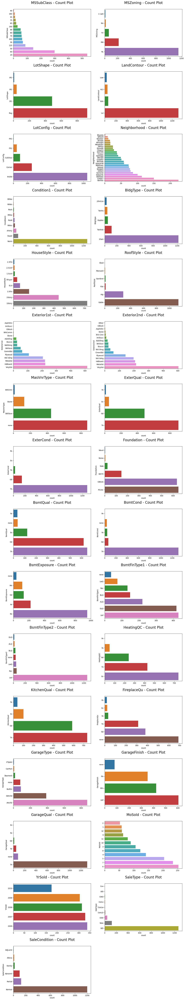

In [34]:
# Lets plot all the categorical columns
num_cols = len(cat_col)
num_rows = (num_cols + 1) 
plt.figure(figsize=(15, num_rows * 5))
c = 0
for i in cat_col:
    c += 1
    plt.subplot(num_rows, 2, c)
    sns.countplot(y=housing_data[str(i)], order=housing_data[str(i)].value_counts().sort_values().index)
    plt.title(str(i) + " - Count Plot\n", fontsize=20) 
plt.tight_layout()  
plt.show()

In [35]:
# Checking Outliers | Univariate Analysis of the Continous columns
#Lets first observe the data in terms of percentile
housing_data.describe(percentiles=[.25,.5,.75,.90,.95,.99])

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,MasVnrArea,BsmtUnfSF,TotalBsmtSF,GrLivArea,BedroomAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,SalePrice,Total_sqr_footage,Total_Bathrooms,Total_porch_sf,Total_Age,Garage_age,Remodel_age
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,69.863699,10516.828082,6.099315,5.575342,1971.267808,103.117123,567.240411,1057.429452,1515.463699,2.866438,6.517808,0.613014,1.767123,472.980137,180921.195890,1999.808219,2.210616,181.329452,36.547945,29.226712,22.950000
std,22.027677,9981.264932,1.382997,1.112799,30.202904,180.731373,441.866955,438.705324,525.480383,0.815778,1.625393,0.644666,0.747315,213.804841,79442.502883,773.992942,0.785399,156.656097,30.250152,24.034844,20.640653
min,21.000000,1300.000000,1.000000,1.000000,1872.000000,0.000000,0.000000,0.000000,334.000000,0.000000,2.000000,0.000000,0.000000,0.000000,34900.000000,334.000000,1.000000,0.000000,0.000000,0.000000,-1.000000
25%,60.000000,7553.500000,5.000000,5.000000,1954.000000,0.000000,223.000000,795.750000,1129.500000,2.000000,5.000000,0.000000,1.000000,334.500000,129975.000000,1493.000000,2.000000,45.000000,8.000000,7.000000,4.000000
50%,69.000000,9478.500000,6.000000,5.000000,1973.000000,0.000000,477.500000,991.500000,1464.000000,3.000000,6.000000,1.000000,2.000000,480.000000,163000.000000,1863.500000,2.000000,164.000000,35.000000,28.000000,14.000000
75%,79.000000,11601.500000,7.000000,6.000000,2000.000000,164.250000,808.000000,1298.250000,1776.750000,3.000000,7.000000,1.000000,2.000000,576.000000,214000.000000,2383.500000,2.500000,266.000000,54.000000,46.000000,41.000000
90%,92.000000,14381.700000,8.000000,7.000000,2006.000000,335.000000,1232.000000,1602.200000,2158.300000,4.000000,9.000000,1.000000,3.000000,757.100000,278000.000000,3023.100000,3.500000,382.000000,84.000000,61.000000,56.000000
95%,104.000000,17401.150000,8.000000,8.000000,2007.000000,456.000000,1468.000000,1753.000000,2466.100000,4.000000,10.000000,2.000000,3.000000,850.100000,326100.000000,3334.150000,3.500000,472.150000,91.000000,78.000000,58.000000
99%,137.410000,37567.640000,10.000000,9.000000,2009.000000,791.280000,1797.050000,2155.050000,3123.480000,5.000000,11.000000,2.000000,3.000000,1002.790000,442567.010000,4107.510000,4.000000,670.000000,110.410000,90.000000,60.000000


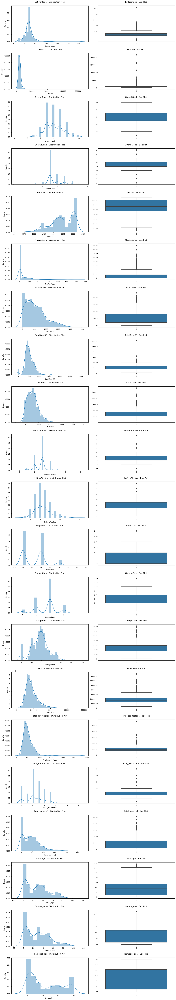

In [36]:
#Lets plot all the numerical columns and observe the outliers
plt.figure(figsize=(15,100))
c=0
for i in num_col:
    c=c+1
    plt.subplot(25,2,c)
    plt.title(str(i)+" - Distribution Plot \n")
    sns.distplot(housing_data[str(i)])
    c=c+1
    plt.subplot(25,2,c)
    plt.title(str(i)+" - Box Plot \n")
    sns.boxplot(housing_data[str(i)])
plt.tight_layout()
plt.show()

In [37]:
#As we can observe there are outlier in many columns, listing them below
outlier = ['LotFrontage','LotArea','MasVnrArea','GrLivArea','Total_sqr_footage','Total_porch_sf']
for i in outlier:
    qnt = housing_data[i].quantile(0.98)#removing data above 98 percentile
    housing_data = housing_data[housing_data[i] < qnt]

In [38]:
#Lets observe the new shape of the data
housing_data.shape

(1290, 52)

1. Also we can see Outliers in some more variables but we will not drop them since this may lead to data loss.
2. The outliers will be treated during min-max ( normalisation ) scaling as handling outliers could lead us to data loss

#### 1.3.2: Bivariate Analysis of the Categorical columns

1. Here the Target Variable is SalePrice and will be compared with other variables¶
2. Here we will use Box Plot to analyze the relationship between Target variable and other Categorical variables

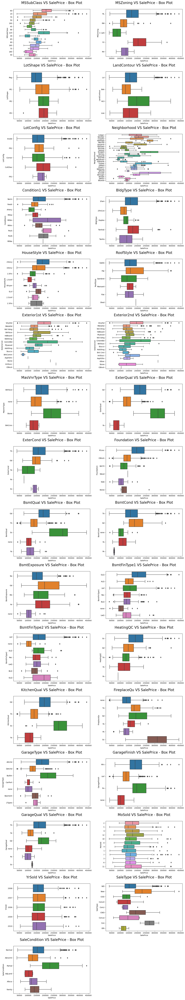

In [39]:
# Lets plot SalePrice against all the categorical columns

# Lets plot all the categorical columns
num_cols = len(cat_col)
num_rows = (num_cols + 1) 
plt.figure(figsize=(15, num_rows * 5))
c = 0
for i in cat_col:
    c += 1
    plt.subplot(num_rows, 2, c)
    sns.boxplot(x = 'SalePrice', y = housing_data[str(i)], data = housing_data)
    plt.title(str(i)+" VS SalePrice - Box Plot\n",fontsize=20)
plt.tight_layout()  
plt.show()


#### 1.3.3:  Bivariate Analysis of the Continous columns

<Figure size 7000x9000 with 0 Axes>

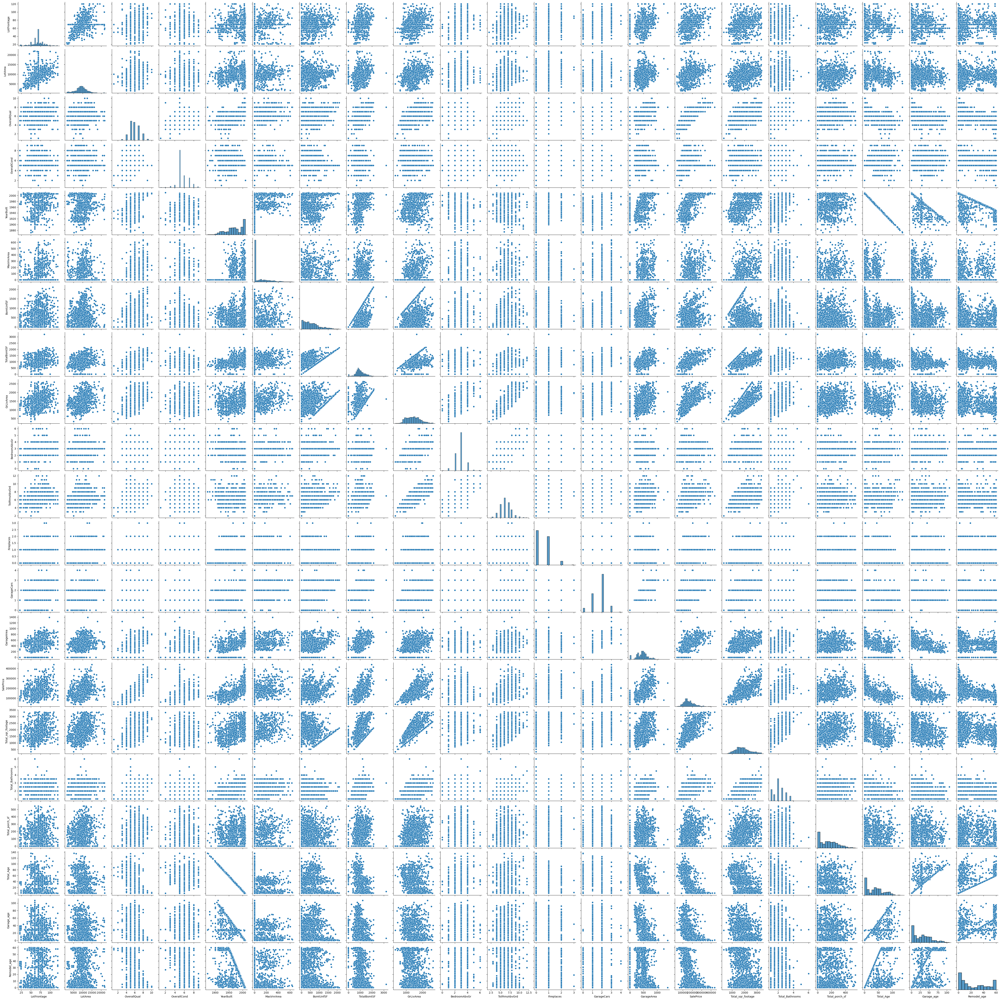

In [40]:
# Here we will use Pair Plot to analyze the relationship between Target variable SalePrice vs other Continous variables
plt.figure(figsize = (70, 90))
sns.pairplot(housing_data, vars= num_col)
plt.show()

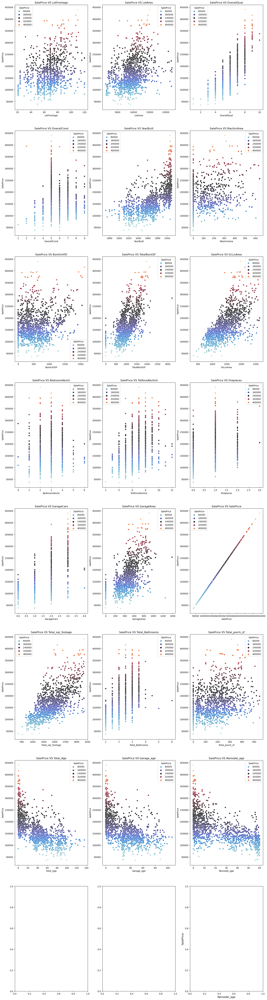

In [41]:
#Visualising numerical predictor variables with Target Variables
housing_data_num = housing_data[num_col]
fig,axs= plt.subplots(8,3,figsize=(20,80))
for i,ax in zip(housing_data_num.columns,axs.flatten()):
    sns.scatterplot(x=i, y='SalePrice', hue='SalePrice',data=housing_data_num,ax=ax,palette='icefire')
    plt.xlabel(i,fontsize=12)
    plt.ylabel('SalePrice',fontsize=12)
    ax.set_title('SalePrice'+' VS '+str(i))

#### Observations:
1. There is a pattern formed between total Total_age and Remodel_age
2. We can observe that the SalesPrice increses with the increase of Total_sqr_footage and that is natural
3. We can observe that the SalesPrice increses with the increase of GrLivArea
4. New properties are costlier than older properties.
5. Total basement area also is directly proportional to the price of the property.


#### 1.3.4: Multivariate Analysis of the all columns using Heat Map

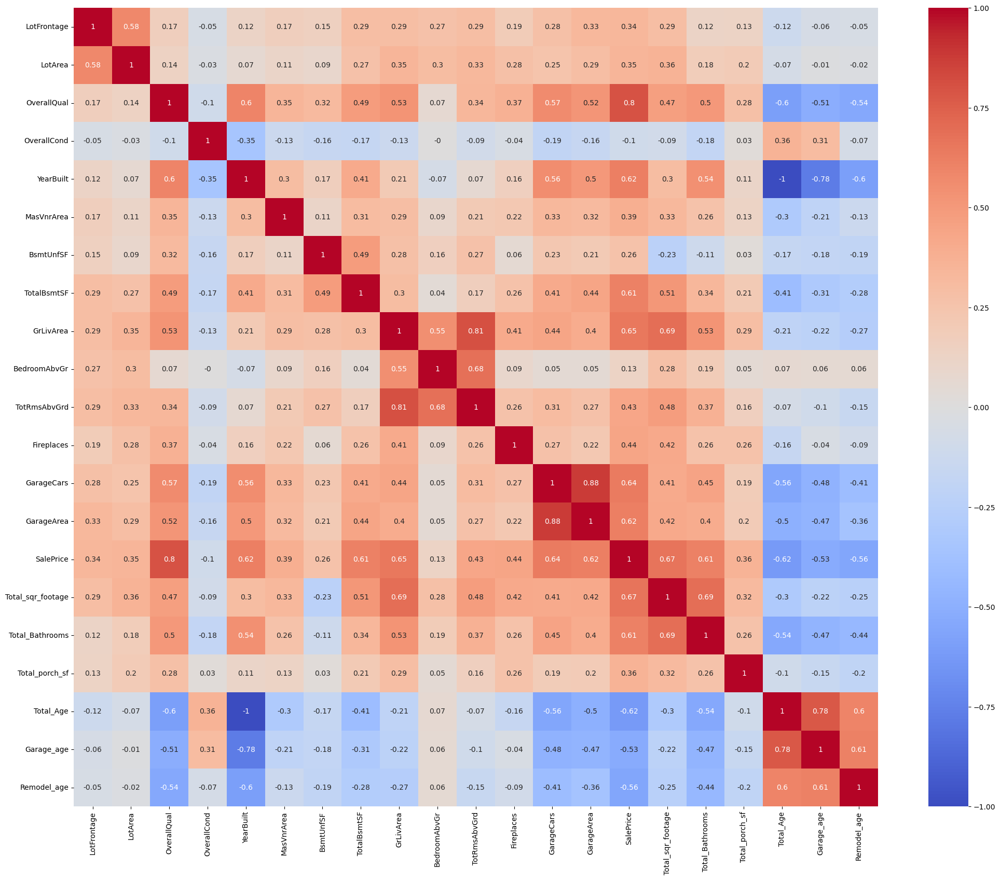

In [42]:
# Checking the corelation
plt.subplots(figsize = (25,20))
#Plotting heatmap of numerical features
sns.heatmap(round(housing_data_num.corr(),2), cmap='coolwarm' , annot=True, center = 0)
plt.show()

#### Observations:
1. **`GarageArea`** and **`GarageCars`** have a strong correlation since both are describing the size.
2. **`TotRmsAbvGrd`** and **`GrLivArea`** have a strong correlation
3. **`GarageAge`** and **`TotalAge`** also have a strong correlation, could be because many garage had been build in the beginning itself 
4. Since these pairs have high correlation , we have to drop any 1 during model preparation with the help of p-value and VIF

In [43]:
#Also lets find out which variables has high correlation with SalesPrice
housing_data[num_col].corr()['SalePrice'].round(decimals = 2).sort_values(ascending=False)

SalePrice            1.00
OverallQual          0.80
Total_sqr_footage    0.67
GrLivArea            0.65
GarageCars           0.64
YearBuilt            0.62
GarageArea           0.62
Total_Bathrooms      0.61
TotalBsmtSF          0.61
Fireplaces           0.44
TotRmsAbvGrd         0.43
MasVnrArea           0.39
Total_porch_sf       0.36
LotArea              0.35
LotFrontage          0.34
BsmtUnfSF            0.26
BedroomAbvGr         0.13
OverallCond         -0.10
Garage_age          -0.53
Remodel_age         -0.56
Total_Age           -0.62
Name: SalePrice, dtype: float64

#### Observations:
1. We can clearly observe that the **`SalesPrice`** is mostly corelated with variables like **`OverallQual`**, **`GrLivArea`**, **`Total_sqr_footage`** and **`GarageCars`**

## 2. Step 2 : Data Preparation

Data preparation has 3 main steps :

1. Encoding on Catagorical Columns ( Encoding or creating Dummy Variables)
2. Dividing the data in terms of Train and Test
3. Scaling on the Continous variables of Train data

### 2.1: Encoding Categorical Columns

In [44]:
cat_col

['MSSubClass',
 'MSZoning',
 'LotShape',
 'LandContour',
 'LotConfig',
 'Neighborhood',
 'Condition1',
 'BldgType',
 'HouseStyle',
 'RoofStyle',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'HeatingQC',
 'KitchenQual',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'MoSold',
 'YrSold',
 'SaleType',
 'SaleCondition']

In [45]:
len(cat_col)

31

1. As we see there are 31 Categorical columns, it will create 31 dummy Variables if we don't set dropFirst=true
2. It will increase number of columns
3. Hence We will go ahead with Label Encoding instead

In [46]:
# Label Encoding
def label_encode_categorical(df, categorical_cols):
    for col in categorical_cols:
        encoded_col = col+suffix
        le = LabelEncoder()
        df[encoded_col] = le.fit_transform(df[col])
        encoded_cat_col.append(encoded_col)
        

In [47]:
encoded_cat_col = []
suffix = '_encoded'
label_encode_categorical(housing_data, cat_col)


encoded_cat_col

['MSSubClass_encoded',
 'MSZoning_encoded',
 'LotShape_encoded',
 'LandContour_encoded',
 'LotConfig_encoded',
 'Neighborhood_encoded',
 'Condition1_encoded',
 'BldgType_encoded',
 'HouseStyle_encoded',
 'RoofStyle_encoded',
 'Exterior1st_encoded',
 'Exterior2nd_encoded',
 'MasVnrType_encoded',
 'ExterQual_encoded',
 'ExterCond_encoded',
 'Foundation_encoded',
 'BsmtQual_encoded',
 'BsmtCond_encoded',
 'BsmtExposure_encoded',
 'BsmtFinType1_encoded',
 'BsmtFinType2_encoded',
 'HeatingQC_encoded',
 'KitchenQual_encoded',
 'FireplaceQu_encoded',
 'GarageType_encoded',
 'GarageFinish_encoded',
 'GarageQual_encoded',
 'MoSold_encoded',
 'YrSold_encoded',
 'SaleType_encoded',
 'SaleCondition_encoded']

1. We will create Dummy Variables using get_dummies function
2. We will use the parameter drop_first as True to drop the 1st dummy variable of each categorical column to increases the efficiency of the model
3. We will use the orginal dataset so that the orginal categorical column gets removed wgich again increases the efficiency of the model

In [48]:
len(encoded_cat_col)

31

In [49]:
#Dropping the columns added in the list
housing_data.drop(labels = cat_col, axis = 1, inplace=True) 

In [50]:
#displaying the updated Datatypes
housing_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1290 entries, 0 to 1458
Data columns (total 52 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   LotFrontage            1290 non-null   float64
 1   LotArea                1290 non-null   int64  
 2   OverallQual            1290 non-null   int64  
 3   OverallCond            1290 non-null   int64  
 4   YearBuilt              1290 non-null   int64  
 5   MasVnrArea             1290 non-null   float64
 6   BsmtUnfSF              1290 non-null   int64  
 7   TotalBsmtSF            1290 non-null   int64  
 8   GrLivArea              1290 non-null   int64  
 9   BedroomAbvGr           1290 non-null   int64  
 10  TotRmsAbvGrd           1290 non-null   int64  
 11  Fireplaces             1290 non-null   int64  
 12  GarageCars             1290 non-null   int64  
 13  GarageArea             1290 non-null   int64  
 14  SalePrice              1290 non-null   int64  
 15  Total_sqr

In [51]:
housing_data.shape

(1290, 52)

In [52]:
housing_data.head()

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,MasVnrArea,BsmtUnfSF,TotalBsmtSF,GrLivArea,BedroomAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,SalePrice,Total_sqr_footage,Total_Bathrooms,Total_porch_sf,Total_Age,Garage_age,Remodel_age,MSSubClass_encoded,MSZoning_encoded,LotShape_encoded,LandContour_encoded,LotConfig_encoded,Neighborhood_encoded,Condition1_encoded,BldgType_encoded,HouseStyle_encoded,RoofStyle_encoded,Exterior1st_encoded,Exterior2nd_encoded,MasVnrType_encoded,ExterQual_encoded,ExterCond_encoded,Foundation_encoded,BsmtQual_encoded,BsmtCond_encoded,BsmtExposure_encoded,BsmtFinType1_encoded,BsmtFinType2_encoded,HeatingQC_encoded,KitchenQual_encoded,FireplaceQu_encoded,GarageType_encoded,GarageFinish_encoded,GarageQual_encoded,MoSold_encoded,YrSold_encoded,SaleType_encoded,SaleCondition_encoded
0,65.0,8450,7,5,2003,196.0,150,856,1710,3,8,0,2,548,208500,2416,3.5,61,5,5.0,5,9,3,3,3,4,5,2,0,5,1,12,13,1,2,4,2,2,3,3,2,5,0,2,5,1,1,4,4,2,8,4
1,80.0,9600,6,8,1976,0.0,284,1262,1262,3,6,1,2,460,181500,2240,2.5,298,31,31.0,31,4,3,3,3,2,24,1,0,2,1,8,8,3,3,4,1,2,3,1,0,5,0,3,4,1,1,4,7,1,8,4
2,68.0,11250,7,5,2001,162.0,434,920,1786,3,6,1,2,608,223500,2272,3.5,42,7,7.0,6,9,3,0,3,4,5,2,0,5,1,12,13,1,2,4,2,2,3,2,2,5,0,2,4,1,1,4,11,2,8,4
3,60.0,9550,7,5,1915,0.0,540,756,1717,3,7,1,3,642,140000,1933,2.0,307,91,8.0,36,10,3,0,3,0,6,2,0,5,1,13,15,3,3,4,0,3,1,3,0,5,2,2,2,5,2,4,4,0,8,0
4,84.0,14260,8,5,2000,350.0,490,1145,2198,4,9,1,3,836,250000,2853,3.5,276,8,8.0,8,9,3,0,3,2,15,2,0,5,1,12,13,1,2,4,2,2,3,0,2,5,0,2,4,1,1,4,3,2,8,4


In [53]:
housing_data.describe()

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,MasVnrArea,BsmtUnfSF,TotalBsmtSF,GrLivArea,BedroomAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,SalePrice,Total_sqr_footage,Total_Bathrooms,Total_porch_sf,Total_Age,Garage_age,Remodel_age,MSSubClass_encoded,MSZoning_encoded,LotShape_encoded,LandContour_encoded,LotConfig_encoded,Neighborhood_encoded,Condition1_encoded,BldgType_encoded,HouseStyle_encoded,RoofStyle_encoded,Exterior1st_encoded,Exterior2nd_encoded,MasVnrType_encoded,ExterQual_encoded,ExterCond_encoded,Foundation_encoded,BsmtQual_encoded,BsmtCond_encoded,BsmtExposure_encoded,BsmtFinType1_encoded,BsmtFinType2_encoded,HeatingQC_encoded,KitchenQual_encoded,FireplaceQu_encoded,GarageType_encoded,GarageFinish_encoded,GarageQual_encoded,MoSold_encoded,YrSold_encoded,SaleType_encoded,SaleCondition_encoded
count,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000
mean,67.135659,9172.652713,5.957364,5.575194,1970.429457,81.151163,563.310078,1004.504651,1424.022481,2.821705,6.309302,0.546512,1.699225,451.386822,167438.954264,1860.427907,2.125581,158.955814,37.382171,29.914729,23.809302,6.114729,3.035659,2.008527,2.800000,3.066667,12.090698,2.017054,0.534884,2.986822,1.367442,9.608527,10.317829,2.300000,2.603101,3.738760,1.375969,2.375969,2.845736,2.367442,2.868992,4.761240,1.594574,2.411628,3.920155,2.569767,1.346512,3.928682,6.501550,1.811628,7.510853,3.755814
std,17.234819,3382.298199,1.287481,1.106160,30.079183,131.331451,433.622435,380.443649,412.074577,0.775394,1.449322,0.612584,0.727014,201.943743,60739.709465,580.904376,0.747198,127.945496,30.124677,24.125168,20.906476,3.605984,0.648660,1.395133,0.684756,1.596220,6.033163,0.856511,1.238424,1.917373,0.789689,3.203386,3.565598,0.927512,0.617050,0.728965,0.715914,0.836825,0.683566,1.152402,1.904806,0.919769,1.745428,0.759949,1.353894,1.969949,0.875540,0.658794,2.971091,1.323894,1.585511,1.102955
min,21.000000,1300.000000,1.000000,1.000000,1872.000000,0.000000,0.000000,0.000000,334.000000,0.000000,2.000000,0.000000,0.000000,0.000000,35311.000000,334.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,60.000000,7200.000000,5.000000,5.000000,1952.000000,0.000000,219.250000,780.000000,1098.250000,2.000000,5.000000,0.000000,1.000000,308.000000,127000.000000,1456.000000,1.500000,40.000000,8.000000,7.000000,4.000000,4.000000,3.000000,0.000000,3.000000,2.000000,7.000000,2.000000,0.000000,2.000000,1.000000,8.000000,8.000000,1.000000,2.000000,4.000000,1.000000,2.000000,3.000000,2.000000,1.000000,5.000000,0.000000,2.000000,2.000000,1.000000,1.000000,4.000000,5.000000,1.000000,8.000000,4.000000
50%,69.000000,9100.000000,6.000000,5.000000,1971.500000,0.000000,484.500000,953.000000,1395.500000,3.000000,6.000000,0.000000,2.000000,462.000000,155000.000000,1792.000000,2.000000,149.000000,36.000000,29.000000,16.000000,4.000000,3.000000,3.000000,3.000000,4.000000,12.000000,2.000000,0.000000,2.000000,1.000000,12.000000,13.000000,3.000000,3.000000,4.000000,1.000000,2.000000,3.000000,3.000000,2.000000,5.000000,1.000000,3.000000,5.000000,1.000000,1.000000,4.000000,7.000000,2.000000,8.000000,4.000000
75%,75.000000,11002.250000,7.000000,6.000000,20

In [54]:
housing_data = housing_data.round(decimals = 2)

In [55]:
housing_data.head()

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,MasVnrArea,BsmtUnfSF,TotalBsmtSF,GrLivArea,BedroomAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,SalePrice,Total_sqr_footage,Total_Bathrooms,Total_porch_sf,Total_Age,Garage_age,Remodel_age,MSSubClass_encoded,MSZoning_encoded,LotShape_encoded,LandContour_encoded,LotConfig_encoded,Neighborhood_encoded,Condition1_encoded,BldgType_encoded,HouseStyle_encoded,RoofStyle_encoded,Exterior1st_encoded,Exterior2nd_encoded,MasVnrType_encoded,ExterQual_encoded,ExterCond_encoded,Foundation_encoded,BsmtQual_encoded,BsmtCond_encoded,BsmtExposure_encoded,BsmtFinType1_encoded,BsmtFinType2_encoded,HeatingQC_encoded,KitchenQual_encoded,FireplaceQu_encoded,GarageType_encoded,GarageFinish_encoded,GarageQual_encoded,MoSold_encoded,YrSold_encoded,SaleType_encoded,SaleCondition_encoded
0,65.0,8450,7,5,2003,196.0,150,856,1710,3,8,0,2,548,208500,2416,3.5,61,5,5.0,5,9,3,3,3,4,5,2,0,5,1,12,13,1,2,4,2,2,3,3,2,5,0,2,5,1,1,4,4,2,8,4
1,80.0,9600,6,8,1976,0.0,284,1262,1262,3,6,1,2,460,181500,2240,2.5,298,31,31.0,31,4,3,3,3,2,24,1,0,2,1,8,8,3,3,4,1,2,3,1,0,5,0,3,4,1,1,4,7,1,8,4
2,68.0,11250,7,5,2001,162.0,434,920,1786,3,6,1,2,608,223500,2272,3.5,42,7,7.0,6,9,3,0,3,4,5,2,0,5,1,12,13,1,2,4,2,2,3,2,2,5,0,2,4,1,1,4,11,2,8,4
3,60.0,9550,7,5,1915,0.0,540,756,1717,3,7,1,3,642,140000,1933,2.0,307,91,8.0,36,10,3,0,3,0,6,2,0,5,1,13,15,3,3,4,0,3,1,3,0,5,2,2,2,5,2,4,4,0,8,0
4,84.0,14260,8,5,2000,350.0,490,1145,2198,4,9,1,3,836,250000,2853,3.5,276,8,8.0,8,9,3,0,3,2,15,2,0,5,1,12,13,1,2,4,2,2,3,0,2,5,0,2,4,1,1,4,3,2,8,4


In [56]:
housing_data.shape

(1290, 52)

### 2.2: Dividing the Data in terms of TRAIN and TEST

In [57]:
#Here we will keep the train size as 70% and automatically test size will be rest 30%
#Also we will keep random_state as a fixed value of 100 so that the data set does no changes
housing_data_train,housing_data_test = train_test_split(housing_data, train_size = 0.7, random_state = 100)
print ("The Size of Train data is",housing_data_train.shape)
print ("The Size of Test data is",housing_data_test.shape)

The Size of Train data is (902, 52)
The Size of Test data is (388, 52)


### 2.3: Scaling of Features

1. We perform scaling to bring the all variables to same scale , also scaling helps in optimisation of the model
2. Scaling are basically 2 types, min-max (normalisation) and standardisation
3. Here we will perform Min-max Scaling on Continous Columns
4. This is because min-max scaling also handles the outliers of the variables and keep all values between 0 and 1
5. Here we will use fit_transform on the training data.
6. fit_transform is used on the training data so that we can scale the training data as well as learn the scaling parameters.

In [58]:
num_col

['LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'MasVnrArea',
 'BsmtUnfSF',
 'TotalBsmtSF',
 'GrLivArea',
 'BedroomAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 'GarageArea',
 'SalePrice',
 'Total_sqr_footage',
 'Total_Bathrooms',
 'Total_porch_sf',
 'Total_Age',
 'Garage_age',
 'Remodel_age']

In [59]:
scaler = MinMaxScaler() 
#Note-The above order of columns in num_cols should be same in df_test, otherwise we will get a wrong r-square value
housing_data_train[num_col] = scaler.fit_transform(housing_data_train[num_col])
housing_data_test[num_col] = scaler.fit_transform(housing_data_test[num_col])

In [60]:
#Inspect the data in percentile after min-max Scaling
housing_data_train[num_col].describe()

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,MasVnrArea,BsmtUnfSF,TotalBsmtSF,GrLivArea,BedroomAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,SalePrice,Total_sqr_footage,Total_Bathrooms,Total_porch_sf,Total_Age,Garage_age,Remodel_age
count,902.000000,902.000000,902.000000,902.000000,902.000000,902.000000,902.000000,902.000000,902.000000,902.000000,902.000000,902.000000,902.000000,902.000000,902.000000,902.000000,902.000000,902.000000,902.000000,902.000000,902.000000
mean,0.468499,0.378431,0.550505,0.513145,0.710555,0.127421,0.265488,0.313282,0.476659,0.470990,0.433149,0.186253,0.422118,0.323455,0.328326,0.506899,0.223947,0.297030,0.277659,0.286031,0.400148
std,0.166552,0.162891,0.145787,0.159550,0.217767,0.210839,0.202934,0.121923,0.179894,0.129466,0.147637,0.201849,0.180074,0.144953,0.150592,0.195825,0.148027,0.235572,0.221172,0.228625,0.350900
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.393939,0.279812,0.444444,0.428571,0.572464,0.000000,0.102074,0.243294,0.339348,0.333333,0.300000,0.000000,0.250000,0.221583,0.227802,0.368926,0.100000,0.080882,0.058824,0.074766,0.066667
50%,0.484848,0.373222,0.555556,0.428571,0.717391,0.000000,0.228901,0.296943,0.469565,0.500000,0.400000,0.166667,0.500000,0.332014,0.295756,0.486612,0.200000,0.284007,0.272059,0.271028,0.266667
75%,0.545455,0.467560,0.666667,0.571429,0.927536,0.205556,0.383310,0.378665,0.598152,0.500000,0.500000,0.333333,0.500000,0.405755,0.397068,0.620000,0.300000,0.455882,0.419118,0.439252,0.733333
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [61]:
#Inspect the data in percentile after min-max Scaling
housing_data_test[num_col].describe()

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,MasVnrArea,BsmtUnfSF,TotalBsmtSF,GrLivArea,BedroomAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,SalePrice,Total_sqr_footage,Total_Bathrooms,Total_porch_sf,Total_Age,Garage_age,Remodel_age
count,388.000000,388.000000,388.00000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000
mean,0.460247,0.379923,0.62049,0.567010,0.718630,0.129981,0.291369,0.519269,0.404879,0.362371,0.407216,0.172680,0.431057,0.432608,0.354123,0.439718,0.284794,0.295068,0.270370,0.304401,0.389089
std,0.190564,0.171124,0.15375,0.135164,0.225101,0.199890,0.228181,0.183706,0.212100,0.154607,0.173110,0.209503,0.185684,0.192979,0.169880,0.207704,0.191040,0.245986,0.224075,0.250248,0.342980
min,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.393939,0.290440,0.50000,0.500000,0.587687,0.000000,0.118734,0.402713,0.224156,0.200000,0.250000,0.000000,0.250000,0.290836,0.243662,0.299419,0.125000,0.069498,0.057407,0.075269,0.066667
50%,0.484848,0.381027,0.62500,0.500000,0.723881,0.000000,0.248837,0.498966,0.395065,0.400000,0.375000,0.000000,0.500000,0.438746,0.323944,0.405851,0.250000,0.274131,0.255556,0.301075,0.250000
75%,0.545455,0.470966,0.75000,0.625000,0.932836,0.247656,0.405297,0.630620,0.550909,0.400000,0.500000,0.333333,0.500000,0.543210,0.451354,0.563203,0.375000,0.465251,0.400000,0.483871,0.666667
max,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## 3. Step 3 : Training the model with Linear Regression using Regularisation

In [62]:
#Define X_train and y_train
y_train = housing_data_train.pop('SalePrice') 
X_train = housing_data_train 

In [63]:
#Define X_test and y_test
y_test = housing_data_test.pop('SalePrice')
X_test = housing_data_test

### 3.1 Model Training using Ridge Regression

In [64]:
# Considering following alphas
params = {'alpha': [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 
                    9.0, 10.0, 20, 50, 100, 500, 1000 ]}

ridge = Ridge()

# cross validation
folds = 5
ridge_model_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'r2', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
ridge_model_cv.fit(X_train, y_train)

Fitting 5 folds for each of 27 candidates, totalling 135 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3, 0.4, 0.5,
                                   0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0,
                                   6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500,
                                   1000]},
             return_train_score=True, scoring='r2', verbose=1)

In [65]:
# check the result for different aplhas
ridge_cv_results = pd.DataFrame(ridge_model_cv.cv_results_)
ridge_cv_results = ridge_cv_results[ridge_cv_results['param_alpha']<=500]
ridge_cv_results[['param_alpha', 'mean_train_score', 'mean_test_score', 'rank_test_score']].sort_values(by = ['rank_test_score'])

,param_alpha,mean_train_score,mean_test_score,rank_test_score
6,0.4,0.888290,0.862349,1
7,0.5,0.888227,0.862347,2
5,0.3,0.888343,0.862331,3
8,0.6,0.888155,0.862329,4
9,0.7,0.888073,0.862295,5
4,0.2,0.888385,0.862289,6
10,0.8,0.887984,0.862249,7
3,0.1,0.888420,0.862210,8
11,0.9,0.887887,0.862190,9
12,1.0,0.887782,0.862120,10


In [66]:
print("Ridge Model Best Params: ",ridge_model_cv.best_params_)

Ridge Model Best Params:  {'alpha': 0.4}


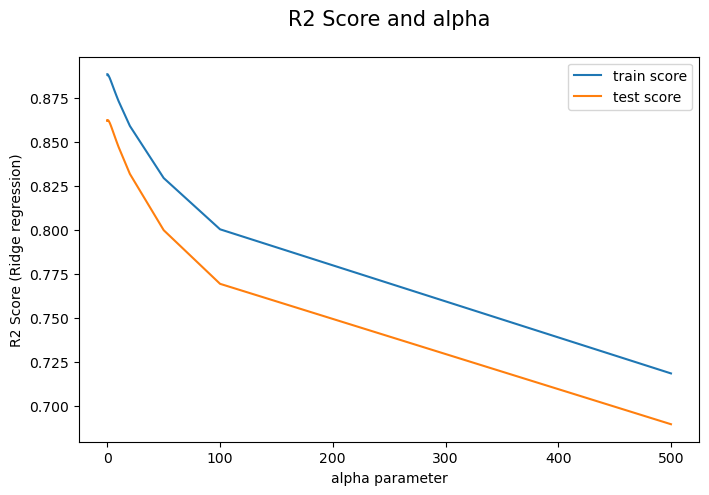

In [67]:
# plotting Negative Mean Absolute Error vs alpha for train and test

ridge_cv_results['param_alpha'] = ridge_cv_results['param_alpha'].astype('int32')

plt.figure(figsize=(8,5))
plt.plot(ridge_cv_results['param_alpha'], ridge_cv_results['mean_train_score'])
plt.plot(ridge_cv_results['param_alpha'], ridge_cv_results['mean_test_score'])
plt.xlabel('alpha parameter')
plt.ylabel('R2 Score (Ridge regression)')
plt.title("R2 Score and alpha\n",fontsize=15)
plt.legend(['train score', 'test score'], loc='upper right')
plt.show()

In [68]:
print(ridge_model_cv.best_params_)

{'alpha': 0.4}


In [69]:
alpha = 0.4
ridge = Ridge(alpha=alpha)
ridge.fit(X_train, y_train)
ridge.coef_

array([ 1.58567895e-02,  5.28489919e-02,  2.11108114e-01,  9.63387439e-02,
        5.71665506e-02,  3.01727683e-02,  7.99389287e-03,  9.17349004e-02,
        1.16200392e-01, -3.98926689e-02,  1.64130073e-02,  2.16679607e-02,
        3.22531209e-02,  3.85260539e-02,  1.58655651e-01,  9.85496944e-03,
        2.98282165e-02, -5.80070051e-02,  1.57354577e-03, -1.59727337e-02,
       -6.28614855e-04, -6.09852253e-03, -1.10577249e-03, -4.88390361e-03,
        1.01720306e-04,  6.68457124e-05,  2.00091587e-03, -8.97519520e-03,
       -2.14941244e-03,  1.45918876e-03, -2.23618673e-03,  1.35639381e-03,
        4.52237697e-03, -1.62554982e-02,  2.43405082e-03,  3.03056689e-03,
       -1.64738094e-02,  8.82591516e-03, -5.28669746e-03,  1.48455863e-03,
        5.08231261e-03, -1.63666370e-03, -1.81058557e-02, -5.99205135e-03,
        2.89056824e-03, -3.02582999e-03,  5.89169953e-03,  3.95881890e-04,
        3.12932582e-05, -1.09850512e-03,  7.37843659e-03])

In [70]:
y_pred_train = ridge.predict(X_train)
print('Ridge Model Details on train data:')
print('**********************************************')
print(f'R2 Score on train data: {r2_score(y_train,y_pred_train)}')
#Lets calculate the mean squared error value
mse = mean_squared_error(y_train, y_pred_train)
print(f'MSE on train data: {mse}')
print('**********************************************')

Ridge Model Details on train data:
**********************************************
R2 Score on train data: 0.8863310809587397
MSE on train data: 0.002574929599925441
**********************************************


In [71]:
# Lets observe the porameters by changing *10 and /10 of the alpha value
alpha = 4.0
ridge = Ridge(alpha=alpha)
ridge.fit(X_train, y_train)
ridge.coef_
y_pred_test = ridge.predict(X_test)
print("The output when alpha is 4.0: ")
mse = mean_squared_error(y_test, ridge.predict(X_test))
print("The mean squared error value is ",mse)
r2_train = metrics.r2_score(y_true=y_train, y_pred=y_pred_train)
print("The r2 value of train data is ",r2_train)
r2_test = metrics.r2_score(y_true=y_test, y_pred=y_pred_test)
print("The r2 value of test data is ",r2_test)
print()
alpha = 0.4
ridge = Ridge(alpha=alpha)
ridge.fit(X_train, y_train)
ridge.coef_
y_pred_test = ridge.predict(X_test)
print("The output when alpha is 0.4: ")
mse = mean_squared_error(y_test, ridge.predict(X_test))
print("The mean squared error value is ",mse)
r2_train = metrics.r2_score(y_true=y_train, y_pred=y_pred_train)
print("The r2 value of train data is ",r2_train)
r2_test = metrics.r2_score(y_true=y_test, y_pred=y_pred_test)
print("The r2 value of test data is ",r2_test)
print()
alpha = .004
ridge = Ridge(alpha=alpha)
ridge.fit(X_train, y_train)
ridge.coef_
y_pred_test = ridge.predict(X_test)
print("The output when alpha is 0.04: ")
mse = mean_squared_error(y_test, ridge.predict(X_test))
print("The mean squared error value is ",mse)
r2_train = metrics.r2_score(y_true=y_train, y_pred=y_pred_train)
print("The r2 value of train data is ",r2_train)
r2_test = metrics.r2_score(y_true=y_test, y_pred=y_pred_test)
print("The r2 value of test data is ",r2_test)
print()


The output when alpha is 4.0: 
The mean squared error value is  0.0034659294651169918
The r2 value of train data is  0.8863310809587397
The r2 value of test data is  0.879591590491043

The output when alpha is 0.4: 
The mean squared error value is  0.003215527693532705
The r2 value of train data is  0.8863310809587397
The r2 value of test data is  0.8882906939662117

The output when alpha is 0.04: 
The mean squared error value is  0.0034044036776487104
The r2 value of train data is  0.8863310809587397
The r2 value of test data is  0.8817290322039809



#### As we can clearly the that the mean square error is slightly increasing with the increase of alpha value, so we can consider alpha = 0.4 as the best value

In [72]:
# house_pricing_ridge: Features and coefficienst of Ridge
house_pricing_ridge = pd.DataFrame({'Features':X_train.columns, 'Coefficient':ridge.coef_.round(4)})
house_pricing_ridge.reset_index(drop=True, inplace=True)
house_pricing_ridge

,Features,Coefficient
0,LotFrontage,0.0159
1,LotArea,0.0545
2,OverallQual,0.2218
3,OverallCond,0.0993
4,YearBuilt,0.0593
5,MasVnrArea,0.0297
6,BsmtUnfSF,-0.0323
7,TotalBsmtSF,0.1544
8,GrLivArea,0.1599
9,BedroomAbvGr,-0.0442


In [73]:
model_parameter = list(ridge.coef_)
model_parameter.insert(0,ridge.intercept_)
cols = housing_data_train.columns
cols.insert(0,'constant')
ridge_coef = pd.DataFrame(list(zip(cols,model_parameter)))
ridge_coef.columns = ['Feaure','Coef']

In [74]:
ridge_coef.sort_values(by='Coef',ascending=False).head(20)

,Feaure,Coef
3,OverallCond,0.221827
9,BedroomAbvGr,0.159918
8,GrLivArea,0.154361
15,Total_Bathrooms,0.106380
4,YearBuilt,0.099274
5,MasVnrArea,0.059302
2,OverallQual,0.054510
14,Total_sqr_footage,0.038611
13,GarageArea,0.030847
17,Total_Age,0.029719


In [75]:
# dictionary of Features and Coefficients
ridge_coeff_dict = dict(pd.Series(ridge.coef_.round(4), index = X_train.columns))
ridge_coeff_dict

{'LotFrontage': 0.0159,
 'LotArea': 0.0545,
 'OverallQual': 0.2218,
 'OverallCond': 0.0993,
 'YearBuilt': 0.0593,
 'MasVnrArea': 0.0297,
 'BsmtUnfSF': -0.0323,
 'TotalBsmtSF': 0.1544,
 'GrLivArea': 0.1599,
 'BedroomAbvGr': -0.0442,
 'TotRmsAbvGrd': 0.016,
 'Fireplaces': 0.0208,
 'GarageCars': 0.0308,
 'GarageArea': 0.0386,
 'Total_sqr_footage': 0.1064,
 'Total_Bathrooms': 0.0055,
 'Total_porch_sf': 0.0297,
 'Total_Age': -0.0602,
 'Garage_age': 0.0025,
 'Remodel_age': -0.0148,
 'MSSubClass_encoded': -0.0006,
 'MSZoning_encoded': -0.0061,
 'LotShape_encoded': -0.001,
 'LandContour_encoded': -0.0049,
 'LotConfig_encoded': 0.0001,
 'Neighborhood_encoded': 0.0,
 'Condition1_encoded': 0.002,
 'BldgType_encoded': -0.0089,
 'HouseStyle_encoded': -0.0021,
 'RoofStyle_encoded': 0.0012,
 'Exterior1st_encoded': -0.0022,
 'Exterior2nd_encoded': 0.0013,
 'MasVnrType_encoded': 0.0046,
 'ExterQual_encoded': -0.0158,
 'ExterCond_encoded': 0.0024,
 'Foundation_encoded': 0.0029,
 'BsmtQual_encoded': -0.0

In [76]:
# Do an RFE to minimise the features to 20
X_train_ridge = X_train[house_pricing_ridge.Features]

lm = LinearRegression()
lm.fit(X_train_ridge, y_train)

# running RFE
rfe = RFE(lm, n_features_to_select = 20)            
rfe = rfe.fit(X_train_ridge, y_train)

In [77]:
# coefficient values

def find(x):
    return ridge_coeff_dict[x]

# Assign top 10 features to a temp dataframe for further display in the bar plot

temp1_df = pd.DataFrame(list(zip( X_train_ridge.columns, rfe.support_, rfe.ranking_)), columns=['Features', 'rfe_support', 'rfe_ranking'])
temp1_df = temp1_df.loc[temp1_df['rfe_support'] == True]
temp1_df.reset_index(drop=True, inplace=True)

temp1_df['Coefficient'] = temp1_df['Features'].apply(find)
temp1_df = temp1_df.sort_values(by=['Coefficient'], ascending=False)
temp1_df = temp1_df.head(10)
temp1_df

,Features,rfe_support,rfe_ranking,Coefficient
1,OverallQual,True,1,0.2218
6,GrLivArea,True,1,0.1599
5,TotalBsmtSF,True,1,0.1544
12,Total_sqr_footage,True,1,0.1064
2,OverallCond,True,1,0.0993
0,LotArea,True,1,0.0545
11,GarageArea,True,1,0.0386
10,GarageCars,True,1,0.0308
3,MasVnrArea,True,1,0.0297
13,Total_porch_sf,True,1,0.0297


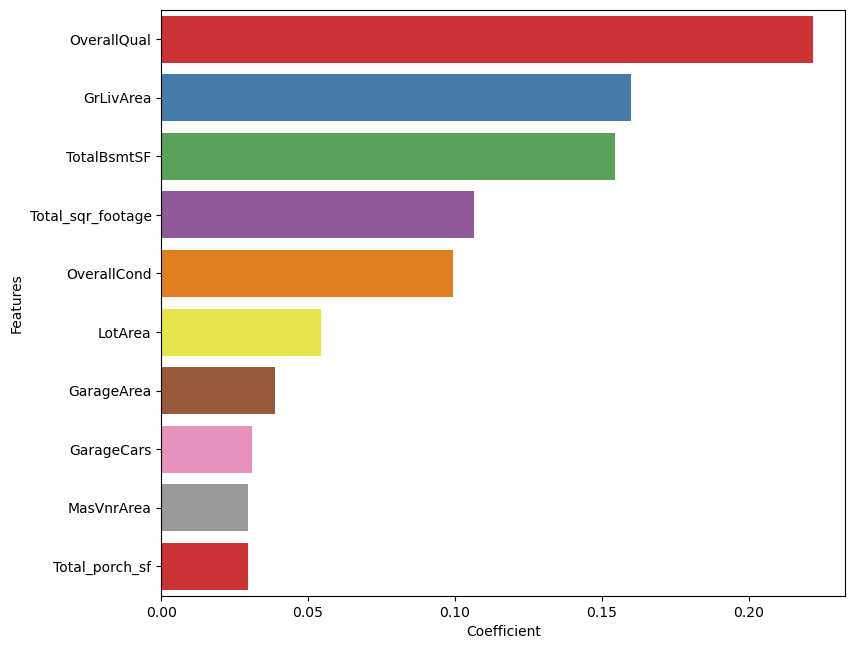

In [78]:
# bar plot for predictor variables.

plt.figure(figsize=(30,35))
plt.subplot(4,3,1)
sns.barplot(y = 'Features', x='Coefficient', palette='Set1', data = temp1_df)
plt.show()

### 3.2 Model Training using Lasso Regression

In [79]:
## Lasso
lasso = Lasso()

# Considering following alphas
params = {'alpha': [0.0001, 0.0002, 0.0003, 0.0004, 0.0005, 0.001, 0.002, 0.003, 0.004, 0.005, 0.01]}

# cross validation
folds = 5
lasso_model_cv = GridSearchCV(estimator = lasso,                         
                        param_grid = params, 
                        scoring= 'r2', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

lasso_model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 11 candidates, totalling 55 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.0002, 0.0003, 0.0004, 0.0005,
                                   0.001, 0.002, 0.003, 0.004, 0.005, 0.01]},
             return_train_score=True, scoring='r2', verbose=1)

In [80]:
# display the mean scores

lasso_cv_results = pd.DataFrame(lasso_model_cv.cv_results_)
lasso_cv_results[['param_alpha', 'mean_train_score', 'mean_test_score', 'rank_test_score']].sort_values(by = ['rank_test_score'])

,param_alpha,mean_train_score,mean_test_score,rank_test_score
0,0.0001,0.887986,0.862664,1
1,0.0002,0.887006,0.862162,2
2,0.0003,0.885908,0.861566,3
3,0.0004,0.884650,0.860622,4
4,0.0005,0.883127,0.859381,5
5,0.001,0.872425,0.848480,6
6,0.002,0.847669,0.823256,7
7,0.003,0.821346,0.793717,8
8,0.004,0.793579,0.762523,9
9,0.005,0.770321,0.738134,10


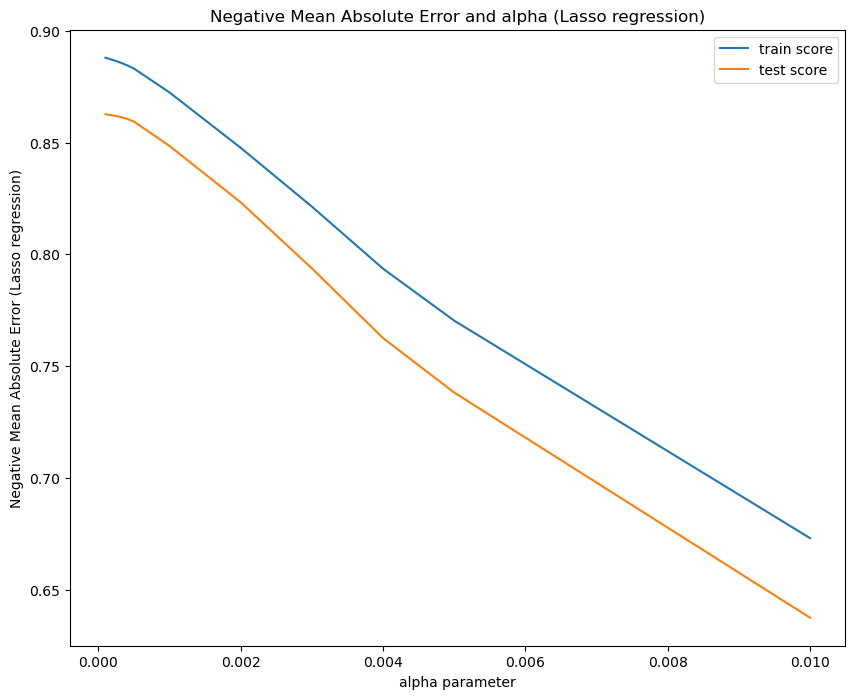

In [81]:
# plotting Negative Mean Absolute Error vs alpha for train and test

lasso_cv_results['param_alpha'] = lasso_cv_results['param_alpha'].astype('float64')

plt.figure(figsize=(10,8))
plt.plot(lasso_cv_results['param_alpha'], lasso_cv_results['mean_train_score'])
plt.plot(lasso_cv_results['param_alpha'], lasso_cv_results['mean_test_score'])
plt.xlabel('alpha parameter')
plt.ylabel('Negative Mean Absolute Error (Lasso regression)')

plt.title("Negative Mean Absolute Error and alpha (Lasso regression)")
plt.legend(['train score', 'test score'], loc='upper right')
plt.show()

In [82]:
# lambda best estimator
lasso_model_cv.best_estimator_

Lasso(alpha=0.0001)

In [83]:
# # Hyperparameter lambda = 0001

alpha = 0.0001

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train, y_train) 
lasso.coef_

array([ 1.14499044e-02,  5.17806710e-02,  2.17541675e-01,  9.00502996e-02,
        6.92779472e-02,  2.48155972e-02,  1.59345743e-02,  7.22693063e-02,
        1.05777105e-01, -2.06262460e-02,  0.00000000e+00,  1.73505436e-02,
        3.41756371e-02,  3.36607041e-02,  1.78475305e-01,  0.00000000e+00,
        2.84939022e-02, -3.90833086e-02, -0.00000000e+00, -1.65191710e-02,
       -4.92429870e-04, -6.34686760e-03, -1.23857988e-03, -4.21004471e-03,
        2.04516614e-05,  9.45594547e-05,  1.83786354e-03, -8.90682076e-03,
       -2.19906241e-03,  1.65654195e-03, -2.25648043e-03,  1.36575667e-03,
        3.22453997e-03, -1.65266335e-02,  2.42629224e-03,  3.27356837e-03,
       -1.72896165e-02,  8.91441734e-03, -5.27370301e-03,  1.40846777e-03,
        5.02402954e-03, -1.76791469e-03, -1.83090069e-02, -6.51031506e-03,
        2.54394327e-03, -3.25252611e-03,  5.50093372e-03,  3.98495763e-04,
        0.00000000e+00, -1.08059587e-03,  7.39670596e-03])

In [84]:
#predicting the R2 value on train data
y_train_pred = lasso.predict(X_train)
print('Lasso Model Details on test data:')
print('**********************************************')
print(f'R2 Score on test data: {r2_score(y_train,y_train_pred)}')
#Lets calculate the mean squared error value
mse = mean_squared_error(y_train, y_train_pred)
print(f'MSE on test data: {mse}')
print('**********************************************')

Lasso Model Details on test data:
**********************************************
R2 Score on test data: 0.8860138654140648
MSE on test data: 0.0025821154489898035
**********************************************


In [85]:
# house_pricing_lasso: Features and coefficienst of Lasso

house_pricing_lasso = pd.DataFrame({'Features':X_train.columns, 'Coefficient':lasso.coef_.round(4)})
house_pricing_lasso = house_pricing_lasso[house_pricing_lasso['Coefficient'] != 0.00]
house_pricing_lasso.reset_index(drop=True, inplace=True)
house_pricing_lasso

,Features,Coefficient
0,LotFrontage,0.0114
1,LotArea,0.0518
2,OverallQual,0.2175
3,OverallCond,0.0901
4,YearBuilt,0.0693
5,MasVnrArea,0.0248
6,BsmtUnfSF,0.0159
7,TotalBsmtSF,0.0723
8,GrLivArea,0.1058
9,BedroomAbvGr,-0.0206


In [86]:
# dictionary of Features and Coefficients

lasso_coeff_dict = dict(pd.Series(lasso.coef_, index = X_train.columns))
lasso_coeff_dict

{'LotFrontage': 0.011449904410009405,
 'LotArea': 0.05178067104329496,
 'OverallQual': 0.21754167478279418,
 'OverallCond': 0.09005029959371166,
 'YearBuilt': 0.06927794721136342,
 'MasVnrArea': 0.024815597212243013,
 'BsmtUnfSF': 0.015934574308086192,
 'TotalBsmtSF': 0.07226930629729711,
 'GrLivArea': 0.10577710487242013,
 'BedroomAbvGr': -0.020626245989092247,
 'TotRmsAbvGrd': 0.0,
 'Fireplaces': 0.01735054361324201,
 'GarageCars': 0.03417563705100314,
 'GarageArea': 0.03366070407407071,
 'Total_sqr_footage': 0.17847530464317585,
 'Total_Bathrooms': 0.0,
 'Total_porch_sf': 0.028493902164819628,
 'Total_Age': -0.039083308599297664,
 'Garage_age': -0.0,
 'Remodel_age': -0.016519171044804045,
 'MSSubClass_encoded': -0.0004924298696658621,
 'MSZoning_encoded': -0.006346867602638031,
 'LotShape_encoded': -0.0012385798833380994,
 'LandContour_encoded': -0.004210044708209851,
 'LotConfig_encoded': 2.0451661404395985e-05,
 'Neighborhood_encoded': 9.455945471711436e-05,
 'Condition1_encoded':

In [87]:
# RFE : minimising features to 20

X_train_lasso = X_train[house_pricing_lasso.Features]

lm = LinearRegression()
lm.fit(X_train_lasso, y_train)

# running RFE

rfe = RFE(lm, n_features_to_select = 20)            
rfe = rfe.fit(X_train_lasso, y_train)

In [88]:
# coefficient values

def find(x):
    return lasso_coeff_dict[x]

# Assign top 10 features to a temp dataframe for further display in the bar plot

temp2_df = pd.DataFrame(list(zip( X_train_lasso.columns, rfe.support_, rfe.ranking_)), columns=['Features', 'rfe_support', 'rfe_ranking'])
temp2_df = temp2_df.loc[temp2_df['rfe_support'] == True]
temp2_df.reset_index(drop=True, inplace=True)

temp2_df['Coefficient'] = temp2_df['Features'].apply(find)
temp2_df = temp2_df.sort_values(by=['Coefficient'], ascending=False)
temp2_df = temp2_df.head(10)
temp2_df

,Features,rfe_support,rfe_ranking,Coefficient
1,OverallQual,True,1,0.217542
11,Total_sqr_footage,True,1,0.178475
6,GrLivArea,True,1,0.105777
2,OverallCond,True,1,0.090050
5,TotalBsmtSF,True,1,0.072269
0,LotArea,True,1,0.051781
9,GarageCars,True,1,0.034176
10,GarageArea,True,1,0.033661
12,Total_porch_sf,True,1,0.028494
3,MasVnrArea,True,1,0.024816


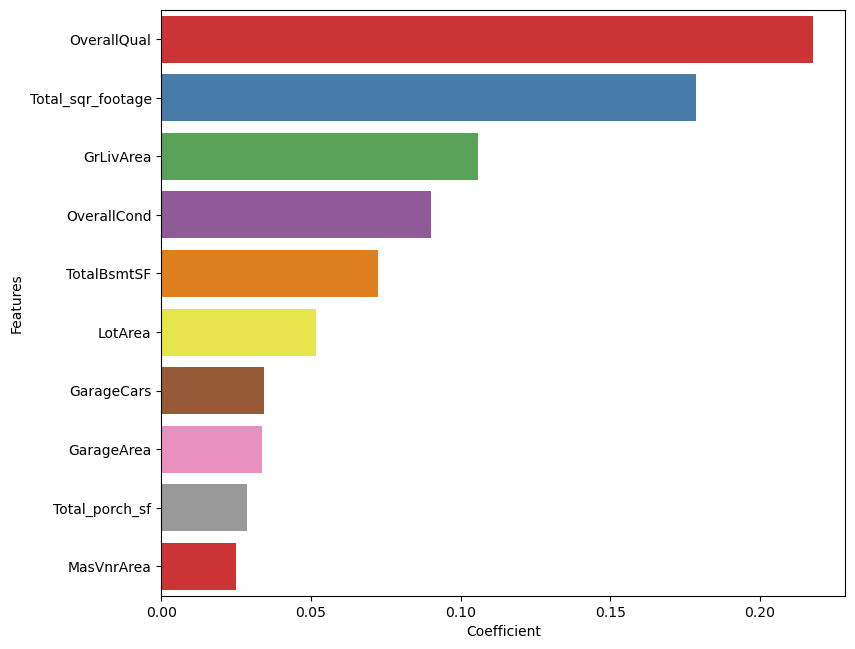

In [89]:
#  bar plot for predictor variables.

plt.figure(figsize=(30,35))
plt.subplot(4,3,1)
sns.barplot(y = 'Features', x='Coefficient', palette='Set1', data = temp2_df)
plt.show()

In [90]:
def plot_residual(model):
    y_train_pred = model.predict(X_train)
    res = y_train - y_train_pred

    fig, axes = plt.subplots(1, 3, figsize=(15,5))
    sns.scatterplot(x=y_train_pred, y=res, ax=axes[0])
    axes[0].set_title("Y Train Pred Vs Residual")
    axes[0].set_xlabel("Y Train Predicted")
    axes[0].set_ylabel("Residuals")
    
    sns.distplot(res, ax=axes[1])
    axes[1].set_title("Residual Distribution")
    
    sns.scatterplot(x=y_train, y=y_train_pred, ax=axes[2])
    axes[2].set_title("Y Train Vs Y Train Pred")
    axes[2].set_xlabel("Y Train")
    axes[2].set_ylabel("Y Train Pred")
    
    plt.show()

    return

Residual Plot for Ridge on Train Data


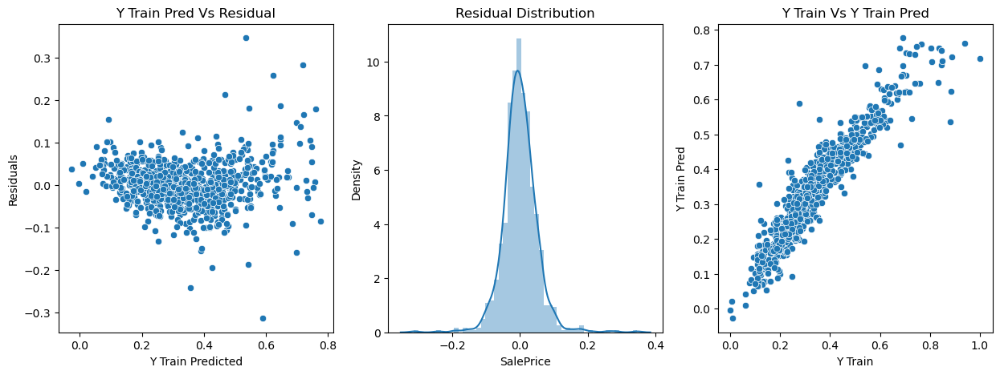

In [91]:
print("Residual Plot for Ridge on Train Data")
plot_residual(ridge)

Residual Plot for Lasso on Train Data


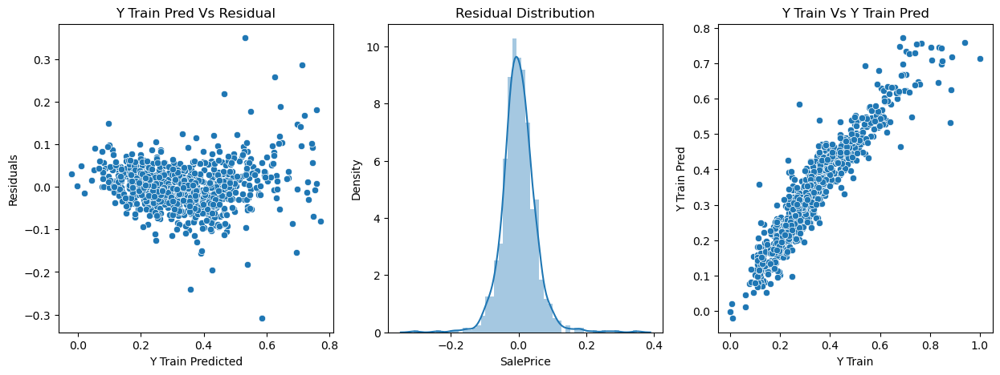

In [92]:
print("Residual Plot for Lasso on Train Data")
plot_residual(lasso)

## 4.Step 4 : Model Prediction and Evaluation using Redge and Lasso Regularization

In [93]:
def plot_residual_test(model):
    y_test_pred = model.predict(X_test)
    res = y_test - y_test_pred

    fig, axes = plt.subplots(1, 3, figsize=(15,5))
    sns.scatterplot(x=y_test_pred, y=res, ax=axes[0])
    axes[0].set_title("Y Test Pred Vs Residual")
    axes[0].set_xlabel("Y Test Predicted")
    axes[0].set_ylabel("Residuals")
    
    sns.distplot(res, ax=axes[1])
    axes[1].set_title("Residual Distribution")
    
    sns.scatterplot(x=y_test, y=y_test_pred, ax=axes[2])
    axes[2].set_title("Y Test Vs Y Test Pred")
    axes[2].set_xlabel("Y Test")
    axes[2].set_ylabel("Y Test Pred")
    
    plt.show()

    return

### 4.1: Model Preditcion and Evaluation using Ridge

In [94]:
y_pred_test = ridge.predict(X_test)
print('Ridge Model Details on test data:')
print('**********************************************')
print(f'R2 Score on test data: {r2_score(y_test,y_pred_test)}')
#Lets calculate the mean squared error value
mse = mean_squared_error(y_test, y_pred_test)
print(f'MSE on test data: {mse}')
print('**********************************************')

Ridge Model Details on test data:
**********************************************
R2 Score on test data: 0.8817290322039809
MSE on test data: 0.0034044036776487104
**********************************************


Residual Plot for Ridge on Test Data


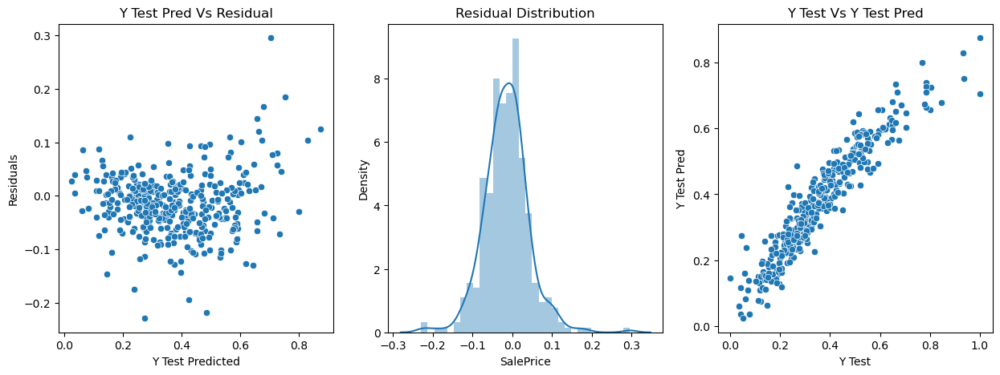

In [95]:
print("Residual Plot for Ridge on Test Data")
plot_residual_test(ridge)

### 4.2: Model Preditcion and Evaluation using Lasso

In [96]:
y_pred_test = lasso.predict(X_test)
print('Lasso Model Details on test data:')
print('**********************************************')
print(f'R2 Score on test data: {r2_score(y_test,y_pred_test)}')
#Lets calculate the mean squared error value
mse = mean_squared_error(y_test, y_pred_test)
print(f'MSE on test data: {mse}')
print('**********************************************')

Lasso Model Details on test data:
**********************************************
R2 Score on test data: 0.8852012508798455
MSE on test data: 0.003304456630203379
**********************************************


Residual Plot for Lasso on Test Data


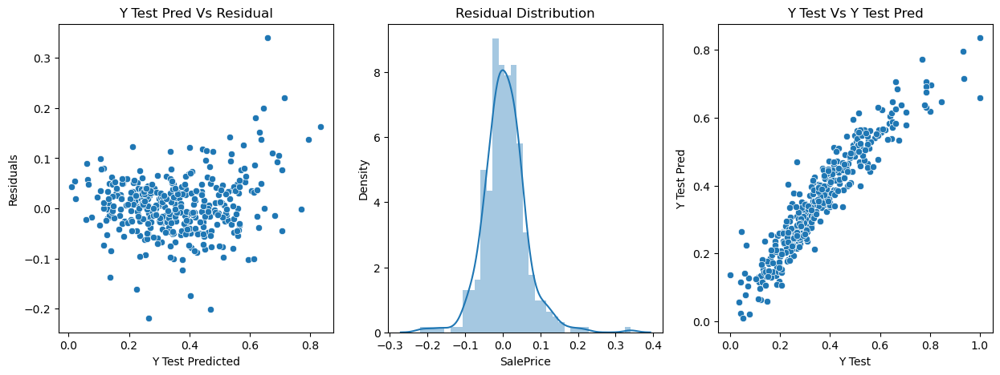

In [97]:
print("Residual Plot for Lasso on Test Data")
plot_residual_test(lasso)

## 5.Step 5 : Conclusions and Results

#### The optimal value of LAMBDA we got in case of Ridge and Lasso is :

1. **`Ridge = 0.4`**
2. **`Lasso = 0.0001`**

#### The r2 value we got in case of Ridge and Lasso is:

1. **`Ridge`**
    - **`Train = 0.8863`**
    - **`Test = 0.8882`**
2. **`Lasso`** 
    - **`Train = 0.8860`**
    - **`Test = 0.8852`**

#### The Mean Squared error in case of Ridge and Lasso is:

1. **`Ridge`**
    - **`Train = 0.002574`**
    - **`Test = 0.0032`**
2. **`Lasso`** 
    - **`Train = 0.00258`**
    - **`Test = 0.0033`**
    
#### We can  observe that 
1. The Mean Squared Error of Ridge is slightly lower than that of Lasso.
2. R2 score is slighly better for Ridge for both train and test data.

#### After creating model in both Ridge and Lasso regressions, we can see that the R2 scores are similar for both Lasso and Ridge regression. However, as Lasso regression penalize more on the dataset, in-turn helping in more feature elimination, we will consider Lasso Regression model as the final model.

#### Thus based Lasso Regularization the TOP 5 Predicted variables are :
1. **`OverallQual`**	
2. **`Total_sqr_footage`**
3. **`GrLivArea`**
4. **`OverallCond`**
5. **`TotalBsmtSF`**


## Answering subjective questions:

### Question 1

#### 1.1. What is the optimal value of alpha for ridge and lasso regression? 
#### 1.2. What will be the changes in the model if you choose double the value of alpha for both ridge and lasso? 
#### 1.3. What will be the most important predictor variables after the change is implemented?

1.1 The optimal value of alpha for lasso and ridge are `0.0001` and `0.4` respectively. 

In [98]:
#Lets find for Ridge first
alpha = 0.4
ridge = Ridge(alpha=alpha)
ridge.fit(X_train, y_train)
ridge.coef_
y_train_pred = ridge.predict(X_train)
y_test_pred = ridge.predict(X_test)
r2_train = metrics.r2_score(y_true=y_train, y_pred=y_train_pred)
print("The r2 value of train data is ",r2_train)
r2_test = metrics.r2_score(y_true=y_test, y_pred=y_test_pred)
print("The r2 value of test data is ",r2_test)
print("The output when alpha is 0.4: ")
mse_train = mean_squared_error(y_train, y_train_pred)
print("The mean squared error value on Train Data is ",mse_train)
mse_test = mean_squared_error(y_test, y_test_pred)
print("The mean squared error value on Test Data is ",mse_test)
print()
alpha = 0.8
ridge = Ridge(alpha=alpha)
ridge.fit(X_train, y_train)
ridge.coef_
y_train_pred = ridge.predict(X_train)
y_test_pred = ridge.predict(X_test)
r2_train = metrics.r2_score(y_true=y_train, y_pred=y_train_pred)
print("The r2 value of train data is ",r2_train)
r2_test = metrics.r2_score(y_true=y_test, y_pred=y_test_pred)
print("The r2 value of test data is ",r2_test)
print("The output when alpha is 0.8: ")
mse_train = mean_squared_error(y_train, y_train_pred)
print("The mean squared error value on Train Data is ",mse_train)
mse_test = mean_squared_error(y_test, y_test_pred)
print("The mean squared error value on Test Data is ",mse_test)

The r2 value of train data is  0.8863310809587397
The r2 value of test data is  0.8882906939662117
The output when alpha is 0.4: 
The mean squared error value on Train Data is  0.002574929599925441
The mean squared error value on Test Data is  0.003215527693532705

The r2 value of train data is  0.8861303056538151
The r2 value of test data is  0.8877292071570307
The output when alpha is 0.8: 
The mean squared error value on Train Data is  0.0025794777409647407
The mean squared error value on Test Data is  0.0032316899672821145


In [99]:
#Let's create a ridge model with alpha  = 0.8
ridge_doubled = Ridge(alpha = 0.8)
ridge_doubled.fit(X_train,y_train)

y_train_ridge_pred_doubled = ridge_doubled.predict(X_train)
y_test_ridge_pred_doubled = ridge_doubled.predict(X_test)
ridge_coef_doubled_df = pd.DataFrame(ridge_doubled.coef_ , columns = ['Coefficient'], index =  X_train.columns)
print("Top 10 correlated features when alpha is 0.8 are :\n")
print(ridge_coef_doubled_df.sort_values(by = 'Coefficient', ascending = False).head(10))

print("Top 5 correlated features when alpha is 0.8 are :\n")
print(ridge_coef_doubled_df.sort_values(by = 'Coefficient', ascending = False).head(5))

Top 10 correlated features when alpha is 0.8 are :

                   Coefficient
OverallQual           0.201541
Total_sqr_footage     0.158456
GrLivArea             0.112159
OverallCond           0.093643
TotalBsmtSF           0.086048
YearBuilt             0.055503
LotArea               0.051592
GarageArea            0.038710
GarageCars            0.033241
MasVnrArea            0.030535
Top 5 correlated features when alpha is 0.8 are :

                   Coefficient
OverallQual           0.201541
Total_sqr_footage     0.158456
GrLivArea             0.112159
OverallCond           0.093643
TotalBsmtSF           0.086048


In [100]:
#Now lets calculate for Lasso
alpha = 0.0001 
lasso = Lasso(alpha=alpha)      
lasso.fit(X_train, y_train) 
lasso.coef_# mse

print("The output when alpha is 0.0001: ")
#Lets calculate the mean squared error value
y_train_pred = lasso.predict(X_train)
r2_train = metrics.r2_score(y_true=y_train, y_pred=y_train_pred)
print("The r2 value of train data is ",r2_train)
#predicting the R2 value on test data
y_test_pred = lasso.predict(X_test)
r2_test = metrics.r2_score(y_true=y_test, y_pred=y_test_pred)
print("The r2 value of test data is ",r2_test)
mse_train = mean_squared_error(y_train, y_train_pred)
print("The mean squared error value on Train Data is ",mse_train)
mse_test = mean_squared_error(y_test, y_test_pred)
print("The mean squared error value on Test Data is ",mse_test)
#predicting the R2 value on train data
print()
alpha = 0.0002 
lasso = Lasso(alpha=alpha)      
lasso.fit(X_train, y_train) 
lasso.coef_# mse

print("The output when alpha is 0.0002: ")
#Lets calculate the mean squared error value

#predicting the R2 value on train data
y_train_pred = lasso.predict(X_train)
r2_train = metrics.r2_score(y_true=y_train, y_pred=y_train_pred)
print("The r2 value of train data is ",r2_train)
#predicting the R2 value on test data
y_test_pred = lasso.predict(X_test)
r2_test = metrics.r2_score(y_true=y_test, y_pred=y_test_pred)
print("The r2 value of test data is ",r2_test)
mse_train = mean_squared_error(y_train, y_train_pred)
print("The mean squared error value on Train Data is ",mse_train)
mse_test = mean_squared_error(y_test, y_test_pred)
print("The mean squared error value on Test Data is ",mse_test)

The output when alpha is 0.0001: 
The r2 value of train data is  0.8860138654140648
The r2 value of test data is  0.8852012508798455
The mean squared error value on Train Data is  0.0025821154489898035
The mean squared error value on Test Data is  0.003304456630203379

The output when alpha is 0.0002: 
The r2 value of train data is  0.884979664275692
The r2 value of test data is  0.8630483059336089
The mean squared error value on Train Data is  0.0026055430943473386
The mean squared error value on Test Data is  0.0039421242560892964


In [101]:
#Let's create a lasso model with alpha  = 0.0002 
lasso_doubled = Lasso(alpha=0.0002)
lasso_doubled.fit(X_train,y_train)
y_train_pred_doubled = lasso_doubled.predict(X_train)
y_test_pred_doubled = lasso_doubled.predict(X_test)
lasso_coef_doubled_df = pd.DataFrame(lasso_doubled.coef_ , columns = ['Coefficient'], index =  X_train.columns)
print("Top 10 correlated features when alpha is 0.0002 are:\n")
print(lasso_coef_doubled_df.sort_values(by = 'Coefficient', ascending = False).head(10))
print("Top 5 correlated features when alpha is 0.0002 are:\n")
print(lasso_coef_doubled_df.sort_values(by = 'Coefficient', ascending = False).head(5))

Top 10 correlated features when alpha is 0.0002 are:

                   Coefficient
Total_sqr_footage     0.239585
OverallQual           0.213860
OverallCond           0.080669
BsmtUnfSF             0.057815
GrLivArea             0.050772
LotArea               0.048669
YearBuilt             0.047133
GarageCars            0.035599
GarageArea            0.030938
Total_porch_sf        0.027395
Top 5 correlated features when alpha is 0.0002 are:

                   Coefficient
Total_sqr_footage     0.239585
OverallQual           0.213860
OverallCond           0.080669
BsmtUnfSF             0.057815
GrLivArea             0.050772


### Question 2
#### You have determined the optimal value of lambda for ridge and lasso regression during the assignment. Now, which one will you choose to apply and why?
After creating model in both Ridge and Lasso regressions, we can see that the R2 scores are similar for both Lasso and Ridge regression. However, as Lasso regression penalize more on the dataset, in-turn helping in more feature elimination, we will consider Lasso Regression model as the final model.

### Question 3
#### After building the model, you realised that the five most important predictor variables in the lasso model are not available in the incoming data. You will now have to create another model excluding the five most important predictor variables. Which are the five most important predictor variables now?

`OverallQual`, `Total_sqr_footage`, `GrLivArea`, `OverallCond`, `TotalBsmtSF` are the five most important predictor variables in the lasso model. Hence we need to exclde these 5 variables from our model.

In [102]:
exclude_list = ['OverallQual', 'Total_sqr_footage', 'GrLivArea', 'OverallCond', 'TotalBsmtSF']
new_col_list_1 = []
new_col_list_2 = []
new_col_list_3 = []

for col in X_train.columns:
    if col.strip() not in exclude_list:
        new_col_list_1.append(col)

for col in X_test.columns:
    if col.strip() not in exclude_list:
        new_col_list_2.append(col)
        
for col in housing_data_train.columns:
    if col.strip() not in exclude_list:
        new_col_list_3.append(col)
        
X_train_new = X_train[new_col_list_1]
X_test_new = X_test[new_col_list_2]
housing_data_train_new = housing_data_train[new_col_list_3]

In [103]:
lasso = Lasso(alpha=0.0001)
lasso.fit(X_train_new,y_train)

y_train_pred = lasso.predict(X_train_new)
y_test_pred = lasso.predict(X_test_new)

print(f'R2 Score on train data: {r2_score(y_true=y_train,y_pred=y_train_pred)}')
print(f'R2 Score on train data: {r2_score(y_true=y_test,y_pred=y_test_pred)}')

R2 Score on train data: 0.8256182988004458
R2 Score on train data: 0.806107003026437


In [104]:
model_param = list(lasso.coef_)
model_param.insert(0,lasso.intercept_)
cols = housing_data_train_new.columns
cols.insert(0,'const')
lasso_coef = pd.DataFrame(list(zip(cols,model_param)))
lasso_coef.columns = ['Feature','Coefficient']
print("Top 10 correlated features when alpha is 0.0001 are:\n")
print(lasso_coef.sort_values(by = 'Coefficient', ascending = False).head(10))
print()
print("Top 5 correlated features when alpha is 0.0001 are:\n")
print(lasso_coef.sort_values(by = 'Coefficient', ascending = False).head(5))


Top 10 correlated features when alpha is 0.0001 are:

            Feature  Coefficient
0       LotFrontage     0.296617
7        Fireplaces     0.162455
11   Total_porch_sf     0.154521
10  Total_Bathrooms     0.113436
8        GarageCars     0.065464
2         YearBuilt     0.063801
4         BsmtUnfSF     0.058040
12        Total_Age     0.042284
3        MasVnrArea     0.028214
14      Remodel_age     0.027183

Top 5 correlated features when alpha is 0.0001 are:

            Feature  Coefficient
0       LotFrontage     0.296617
7        Fireplaces     0.162455
11   Total_porch_sf     0.154521
10  Total_Bathrooms     0.113436
8        GarageCars     0.065464


### Question 4
#### How can you make sure that a model is robust and generalisable? What are the implications of the same for the accuracy of the model and why?

1. The model is expected to be as simple as possible and simpler models are considered as more ‘generic’, though its accuracy will be decreased but it will be more robust.
2. This can be understood from the Bias-Variance trade-off. The simpler the model the more the bias but less variance becoming generalizable. Whereas the complex model will have high variance and low bias.
3. Sometimes underfitting and overfitting are the problems associated with the model. Hence, it is important to have balance in Bias and Variance to avoid such problems. This is possible with “Regularization”.
4. Regularization helps in managing the model complexity by essentially shrinking the coefficients towards zero. This avoids the model becoming too complex, thus reducing the risk of overfitting.
5. Regularization method should be used to keep the model optimum simpler. It penalizes the model if it becomes more complex.
6. Regularization method helps to achieve the Bias-Variance trade off. It compromises by increasing bias to a optimum position where Total Error is minimum.
7. This point also known as Optimum Model Complexity where Model is sufficient simpler to be generalisable and also complex enough to be robust.
8. Making a model simple lead to Bias-Variance trade off.	

#### END